In [3]:
import deeptime 
import numpy as np
from deeptime.util.validation import implied_timescales
from deeptime.plots import plot_ck_test
import matplotlib.pyplot as plt
import pyemma
import sys
from sklearn.cluster import KMeans as K
import pandas as pd
import matplotlib.colors as colors
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
plt.rcParams['axes.linewidth'] = 3
sys.path.append("/home/t/Downloads/msmtool.py")
#import everything from it
from msmtool import *
dd_tica = "/home/t/msm/ntxd/data/trunc/dict.data/tica.dic.data/"
d_tica = {i.replace(".npy",""):np.load(dd_tica+i) for i in os.listdir(dd_tica)}
proj = d_tica["p"]

In [4]:
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np

def combine_dicts(dicts:"list of dictionaries"):
    d = {list(d.keys())[0]:d[list(d.keys())[0]] for d in dicts}
    return d

def fes2d(x,y,labels:"list[xlabel,ylabel,title]", weights=None, ax=None, bins=50, arr = None, title=None,
         log_scale = True, density = True):
    if arr is None:
        z,x,y = np.histogram2d(x,y,bins=bins, weights=weights,density=density)
        arr = np.ma.masked_array(z,z==0)
    else:arr = np.ma.masked_array(arr, arr==0)
    extent = (x.min(), x.max(), y.min(), y.max())
    if log_scale:
        cbar_label = "Free Energy / kT"
        F=-np.log(arr)
        F+=-F.min()
        F = F
    else:
        F = arr
        cbar_label = "Density (Magnitude)"
    if ax is None:fig,ax=plt.subplots(1,1,figsize=(10,12),sharex=True,sharey=True)
    a=ax.contourf(F.T,200,cmap="jet",extent=extent,zorder=-1)
    ax.set_xlabel(labels[0],fontsize=30)
    ax.set_ylabel(labels[-1],fontsize=30)
    ax.tick_params(axis="both",labelsize=25)
    cb = plt.colorbar(a,ax=ax, format = "%.1f")
    cb.set_label(cbar_label,size=20)
    cb.ax.tick_params(labelsize = 18)
    if not title is None:ax.set_title(title, size=30)
    return arr.data,x,y
def sorted_eig(mat, sym = False):
    if sym:lam, v = np.linalg.eigh(mat)
    else:lam, v = np.linalg.eig(mat)
    lam = abs(lam)
    idx = lam.argsort()[::-1]
    lam = lam[idx]
    v = v[:,idx]
    return lam, v
    

In [5]:
def ckpredict(tmat,nlags):
    nstates = tmat.shape[0]
    #decompose the transtition matrix into eigen values so we can propagate it by simply
    ##raising the eigen values to power
    lam, v = sorted_eig(tmat) #keep it all row stochastic, eigen vals will be the same either way
    lam = np.diag(lam)
    v_inv = np.linalg.inv(v)
    predictions = [np.eye(nstates),tmat]
    for i in range (2,nlags+1):
        predictions.append(v@(lam**i)@v_inv)
    return np.stack(predictions)

def cktest(tmats:list):
    nstates = tmats[0].shape[0]
    nlags = len(tmats)
    predict = ckpredict(tmats[0],nlags)
    estimate = np.stack([np.eye(nstates)]+tmats)
    return predict, estimate


# def cktest(tmats:list):
#     """tmats:transition matrices estimated at integer multiples of the principal lagtime.
#     Predictions: raise the transition matrix estimated at the principal lagtime by n sequentially
#     increasing integer powers,such that the number of predictions == the number of estimates + 1.
#     This is equivalent to relaxing or propogating the transition matrix in time by n steps.
#     Estimates: for each estimated transition matrix, propogate it in time by one step, which results in
#     one additional transition matrix than initially estimated.
#     Each estimated transition matrix is propogated in time by one step for consistency with the CK-test
#     implemented in the deeptime software. This protocal is consistent with the original CK-equation as the
#     transition matrices with equivalent propagted lagtimes will ultimately be compared in the test.
#     See https://deeptime-ml.github.io/trunk/api/generated/deeptime.util.validation.ck_test.html"""
#     nstates = tmats[0].shape[0]
#     nlags = len(tmats)
#     predict = np.stack([np.linalg.matrix_power(tmats[0],i) for i in range(nlags+2)])
#     estimate = np.concatenate([predict[:3],np.stack([np.linalg.matrix_power(i,2) for i in tmats[1:]])])
#     return predict, estimate


def plot_free_energy(hist2d:np.ndarray, T:float,
                     title:str,xlabel:str,ylabel:str,
                     x_centers:np.ndarray,y_centers:np.ndarray):
        plt.figure(figsize=(10,10))
        free_energy= -T*0.001987*np.log(hist2d+.000001)        
        im=plt.imshow(free_energy, interpolation='gaussian',
                      extent=[x_centers[0], x_centers[-1],
                      y_centers[0], y_centers[-1]],
                      cmap='jet',aspect='auto')
        imaxes = plt.gca()
        plt.ylabel(ylabel,size=44,labelpad=15)
        plt.xlabel(xlabel,size=44,labelpad=15)
        plt.title(title,size=35)
        plt.xticks(ticks = [.2,.4,.6,.8,1], labels = "0.2,0.4,0.6,0.8,1".split(","),fontsize=40)
        plt.yticks(fontsize=40)
        cbar_ticks=[0,1,2,3]
        cb = plt.colorbar(ticks=cbar_ticks, format=('% .1f'), aspect=10)
        cb.set_label("Free Energy / (kT)",size=45)
        cb.ax.tick_params(labelsize = 40)
        plt.axes(cb.ax)
        plt.clim(vmin=.1, vmax=3.0)
        plt.xlim(0,1)
        plt.tight_layout()

def get_its(tmats:list, tau:int):
    n = len(tmats)
    estimate = np.stack([sorted_eig(mat)[0] for mat in mats],axis = 1)[1:]
    if (est_lams<0).any():
        est_lams = abs(est_lams)
    predict = np.stack([-(tau*i)/np.log(estimate[:,0]**i) for i in range(1,n+1)], axis = 1)
    return predict, estimate


def plot_its(predict:np.ndarray, estimate:np.ndarray, lags:np.ndarray, dt:float=1,
             cmap = plt.cm.jet, figsize = 10):
    """estimate: eigen vals estimated at integrer multiples of the lag time
    predict: eigen vals of the initial lagtime propogated via eponentiation"""
    nprocs = predict.shape[0]
    cs = [cmap(i) for i in range(cmap.N)]
    color_list = [cs[int(i)] for i in np.linspace(10,len(cs)-20,nprocs)]
    color_list = clist[::-1]
    fig,ax = plt.subplots(1,1, figsize = (figsize,figsize))
    lag_dt = lags*dt
    #each iteration plots a single process at all lag times
    for pred_proc, est_proc, color in zip(predict, estimate, color_list):
        ax.plot(lag_dt, pred_proc, label = "Predict", ls = "--", color = color)
        ax.scatter(lag_dt, est_proc, label = "Estimate", color = color)
    ax.plot(lag_dt,np.log(lag_dt), color = black)
    ax.fill_between(lag_dt,np.log(lag_dt), color = gray, alpha = .5)
    return None


In [6]:
def state_map2d(proj,dtraj, title, comp_type = None):
    if comp_type == None:comp_type = input("Please input type of component that is being projected onto")
    nstates = dtraj.max()+1
    color_list = plt.cm.jet
    cs = [color_list(i) for i in range(color_list.N)]
    cmap = colors.ListedColormap(cs)
    boundaries = np.arange(nstates+1).tolist()
    norm = colors.BoundaryNorm(boundaries, cmap.N, clip=True)
    tick_locs = (np.arange(nstates) + 0.5)
    ticklabels = np.arange(1,nstates+1).astype(int)
    #ticklabels = input("Please Enter a CSV string of state lables: ").split(",")
    fig,ax=plt.subplots(1,1,figsize=(10,10))
    s = ax.scatter(proj[:,0],proj[:,1],c=dtraj,s=.3,cmap=cmap,norm=norm)
    ax.set_xlabel(comp_type+" 1",fontsize=45)
    ax.set_ylabel(comp_type+" 2",fontsize=45)
#     ax.set_xlim(extent[0],extent[1])
#     ax.set_ylim(extent[2],extent[3])
    ax.tick_params(axis="x",labelsize=40)
    ax.tick_params(axis="y",labelsize=40)
    cbar = plt.colorbar(s,ax=ax,format = "%.0f")
    cbar.set_ticks(tick_locs)
    cbar.set_ticklabels(ticklabels)
    cbar.set_label("State",size=45)
    cbar.ax.tick_params(labelsize=38)
    ax.set_title(title, size = 45)
    
    
def make_msm(dtraj,lag):
    counts_est = TransitionCountEstimator(lag,"sliding")
    c = counts_est.fit_fetch(dtraj)
    msm_estimator = MaximumLikelihoodMSM(reversible=True)
    msm = msm_estimator.fit_fetch(c)
    return msm, msm.transition_matrix

def reindex_dtraj(dtraj, obs, maximize_obs = True):
    """given a discrete trajectory and an observable, we reindex the trajectory 
    based on the mean of the observable in each state (high to low)
    maximize_obs has been added to increase flexibility as one might want to reindex
    states in order of smallest mean value of observable"""
    nstates = dtraj.max()+1 #number of states
    #get the sorted cluster indices based on mean of observable
    if maximize_obs:
        idx = np.array([obs[np.where(dtraj == i)[0]].mean() for i in range(nstates)]).argsort()[::-1]
    else:
        idx = np.array([obs[np.where(dtraj == i)[0]].mean() for i in range(nstates)]).argsort()
    #make a  mapping of old indices to new indices
    mapping = np.zeros(nstates)
    mapping[idx] = np.arange(nstates)
    #map the states
    new_dtraj = mapping[dtraj]
    return new_dtraj, idx

def reindex_matrix(mat, idx):
    """reindex matrix based on indices in idx"""
    if len(mat.shape) == 2:
        mat = mat[idx,:]; mat = mat[:, idx]
    if len(mat.shape) == 3:
        mat = mat[:,idx,:]; mat = mat[:,:, idx]
    return mat

def plot_mat_error(mat,emat,title,unit,cbarlabel,textcolor:str = "white",cmap = "viridis",
                   ticklabs:list = None, val_text_size:int = 40, err_text_size:int = 40,
                   clims:list=[None,None], decimals:int = 2, round_int = False ):
    
        """mat = square matrix
        unit = string specifying the units"""
        #decimals *= 1e-1
        fig,ax = plt.subplots(1,figsize=(20,20))
        s = ax.imshow(mat, cmap=cmap, vmin = clims[0], vmax = clims[1])
        if ticklabs is None:
            ticklabs = [f"{i+1}" for i in range(mat.shape[0])]
        for i in range(len(mat)):
            for j in range(len(mat)):
                if round_int:
                    val = int(mat[j,i])
                    err = int(emat[j,i])
                else:
                    val = str(round(mat[j,i],decimals))
                    err = str(round(emat[j,i],decimals))
                
                ax.text(i, j,"{}".format(val),
                        va='center', ha='center', color = textcolor,size=val_text_size,weight="bold")
                ax.text(i, j,"\n\n $\pm${}{}".format(err,unit),
                        va='center', ha='center', color = textcolor,size=err_text_size,weight="bold")   
        
        ax.set_yticks(list(range(len(mat))), ticklabs,size=35)
        ax.set_xticks(list(range(len(mat))), ticklabs,size=35)
        ax.set_ylabel(r"$State_{i}$", size=45)
        ax.set_xlabel(r"$State_{j}$", size=45)
        cb = plt.colorbar(s,ax=ax,label=cbarlabel,fraction=0.046,pad=0.04)
        cb.set_label(cbarlabel, size=40)
        cb.ax.tick_params(labelsize=30)
        ax.set_title(title, size = 45)
        return   

def mfpt_mat(tmat, dt, lag):
    nstates = tmat.shape[0]
    mfpt = np.zeros((nstates,nstates))
    for i in range(nstates):
        mfpt[:,i] = deeptime.markov.tools.analysis.mfpt(tmat, i)
    mfpt=mfpt*(dt*lag)
    return mfpt

def pmf1d(x,nbins,range=None):
    count,edge = np.histogram(x,bins = nbins,range=range); p = count/len(x)
    idx = np.digitize(x,edge[1:-1])
    pi = p[idx]
    return p,pi,edge[:-1]+np.diff(edge)
def pmfdd(arrays:"a list of arrays",nbins):
    count,edge,idx = scipy.stats.binned_statistic_dd(np.stack(arrays,axis=1),
            values=None,statistic="count",bins=nbins,expand_binnumbers=True)
    idx = np.ravel_multi_index(idx-1,tuple([nbins for i in range(len(arrays))]))
    p = count.flatten()/len(x)
    pi = p[idx]
    return p,pi

In [7]:
#customize pyemma source code
from pyemma.util.statistics import confidence_interval as _conf
from pyemma.util.types import is_iterable_of_int as _is_iterable_of_int, is_int as _is_int
import numpy as _np
__author__ = 'noe'


def plot_implied_timescales(ITS, ax=None, outfile=None, show_mle=True, show_mean=True,
                            xlog=False, ylog=True, confidence=0.95, refs=None, nits=-1,
                            process=None, units='steps', dt=1., **kwargs):
    r"""Implied timescale plot
    Parameters
    ----------
    ITS : implied timescales object.
        Object whose data will be plotted. Should be of type :class:`ImpliedTimescales <pyemma.msm.ImpliedTimescales>`
        or a 3-tuple with: 1d array of lagtimes, (lagtimes, processes) array of timescales,
        optionally (lagtimes, processes, samples) array of timescales of samples.
    ax : matplotlib Axes object, optional, default = None
        the axes to plot to. When set to None the default Axes object will be used.
    outfile : str, optional, default = None
        output file to write the figure to. When not given, the plot will be displayed
    show_mean : bool, default = True
        Line for mean value will be shown, if available
    show_mle : bool, default = True
        Line for maximum likelihood estimate will be shown
    xlog : bool, optional, default = False
        Iff true, the x-Axis is logarithmized
    ylog : bool, optional, default = True
        Iff true, the y-Axis is logarithmized
    confidence : float, optional, default = 0.95
        The confidence interval for plotting error bars (if available)
    refs : ndarray((m), dtype=float), optional, default = None
        Reference (exact solution or other reference) timescales if known. The number of timescales must match those
        in the ITS object
    nits: integer, default = -1
        Number of implied timescales to be shown. The default behaviour (-1) is to show all timescales available.
        :py:obj:`nits` != -1 and :py:obj:`process` != None are mutually exclusive
    process : iterable of integers, default is None
        list or ndarray((m), dtype=int) containing a list of the processes to be shown. The default behaviour is
        to show all timescales available.
        :py:obj:`process` != None and :py:obj:`nits` != -1 are mutually exclusive
    units: str or list (len=2) of strings, optional, default = 'steps'
        Affects the labeling of the axes. Used with :py:obj:`dt`, allows for changing the physical units of the axes.
        Accepts simple LaTeX math strings, eg. '$\mu$s'
        If this parameter is a list, it will be assumed that units[0] is for the x-axis and units[1] for the y-axis.
    dt: float or list(len=2) of floats, optional, default = 1.0
        Physical time between frames, expressed the units given in :py:obj:`units`. E.g, if you know that each
        frame corresponds to .010 ns, you can use the combination of parameters :py:obj:`dt` =0.01,
        :py:obj:`units` ='ns' to display the implied timescales in ns (instead of frames)
        If this parameter is a list, it will be assumed that dt[0] is for the x-axis and dt[1] for the y-axis.
    **kwargs: Will be passed to pyplot.plot when plotting the MLE datapoints (not the bootstrapped means).
            See the doc of pyplot for more options. Most useful lineproperties like `marker='o'` and/or :markersize=5
    Returns
    -------
    ax : Axes object containing the plot
    """
    if isinstance(ITS, tuple):
        assert len(ITS) in (2, 3)
        lags = _np.asarray(ITS[0])
        timescales = _np.asarray(ITS[1])
        timescales_samples = _np.asarray(ITS[2]) if len(ITS) == 3 and ITS[2] is not None else None
        n_timescales = timescales.shape[1]
        samples_available = timescales_samples is not None
    else:
        lags = ITS.lagtimes
        n_timescales = ITS.number_of_timescales
        timescales = ITS.get_timescales()
        samples_available = ITS.samples_available
        timescales_samples = ITS.timescales_samples
        if timescales_samples is not None:
            timescales_samples = timescales_samples.transpose(1, 2, 0)
    import matplotlib.pyplot as _plt
    # check input
    if ax is None:
        ax = _plt.gca(figsize= (10,6))
    colors = clist ######ADDED#####
    xmax = _np.max(lags)
    srt = _np.argsort(lags)
    # Check the processes to be shown
    if process is not None:
        if nits != -1:
            raise TypeError(
                'optional arguments nits and process are mutually exclusive:', nits, process)
        if not _is_iterable_of_int(process):
            raise ValueError('process has to be an iterable of integers')
        if _np.max(process)+1 > n_timescales:
            raise ValueError(
                'requested process %u, whereas ITS only contains %u timescales' % (
                    _np.max(process), n_timescales))
        # Now that it's for sure that nits==-1,
        # process is iter_of_ints, and the requested processes exist in its object:
        its_idx = process
    else:
        if not _is_int(nits):
            raise TypeError('nits is not an integer, ',nits)
        if nits == -1:
            nits = n_timescales
        its_idx = _np.arange(n_timescales)[:nits]
    # Check units and dt for user error.
    if isinstance(units, list) and len(units) != 2:
        raise TypeError("If units is a list, len(units) has to be = 2")
    if isinstance(dt, list) and len(dt) != 2:
        raise TypeError("If dt is a list, len(dt) has to be = 2")
    # Create list of units and dts for different axis
    if isinstance(units, str):
        units = [units] * 2
    if isinstance(dt, (float, int)):
        dt = [dt] * 2
    for i in its_idx:
        # plot estimate
        if show_mle:
            ax.plot(
                lags[srt] * dt[0], timescales[..., i][srt] * dt[1],
                color=colors[i % len(colors)], **kwargs)
        # sample available?
        if samples_available:
            # plot sample mean
            process_samples = timescales_samples[:, i, :].T
            if show_mean:
                sample_mean = _np.mean(process_samples, axis=0)
                ax.plot(
                    lags[srt] * dt[0], sample_mean[srt] * dt[1], marker='o',
                    color=colors[i % len(colors)], linestyle='dashed')
            lconf, rconf = _conf(process_samples, conf=confidence)
            ax.fill_between(
                lags[srt] * dt[0], lconf[srt] * dt[1], rconf[srt] * dt[1],
                alpha=0.2, color=colors[i % len(colors)])
        # reference available?
        if refs is not None:
            tref = refs[i] * dt[1]
            ax.plot([0, min(tref, xmax) * dt[0]], [tref, tref], color='black', linewidth=1)
    # cutoff
    ax.plot(lags[srt] * dt[0], lags[srt] * dt[1], linewidth=2, color='black')
    ax.set_xlim([1.0 * dt[0], xmax * dt[0]])
    ax.fill_between(
        lags[srt] * dt[0], ax.get_ylim()[0]*_np.ones(len(lags))*dt[1], lags[srt] * dt[1],
        alpha=0.2, color='grey')
    # formatting
    ax.set_xlabel('lag time / %s' % units[0])
    ax.set_ylabel('timescale / %s' % units[1])
    if xlog:
        ax.set_xscale('log')
    if ylog:
        ax.set_yscale('log')
    # show or save
    if outfile is not None:
        _plt.savefig(outfile)
    return ax

In [8]:
#set up colors for each state
n_HMSM_states = 7
#set consistent color scheme
ticklabs = "1,2,3,4,5,6,7".split(",")
#make custom set of colors for each state
nstates = n_HMSM_states = 7
color_list = plt.cm.autumn
cs = [color_list(i) for i in range(color_list.N)]
cmap = colors.ListedColormap(cs)
boundaries = np.arange(nstates+1).tolist()
clist = [cs[int(i)] for i in np.linspace(10,len(cs)-20,nstates)]
clist = clist[::-1]

estimating BayesianHMSM:   0%|                                                                                …

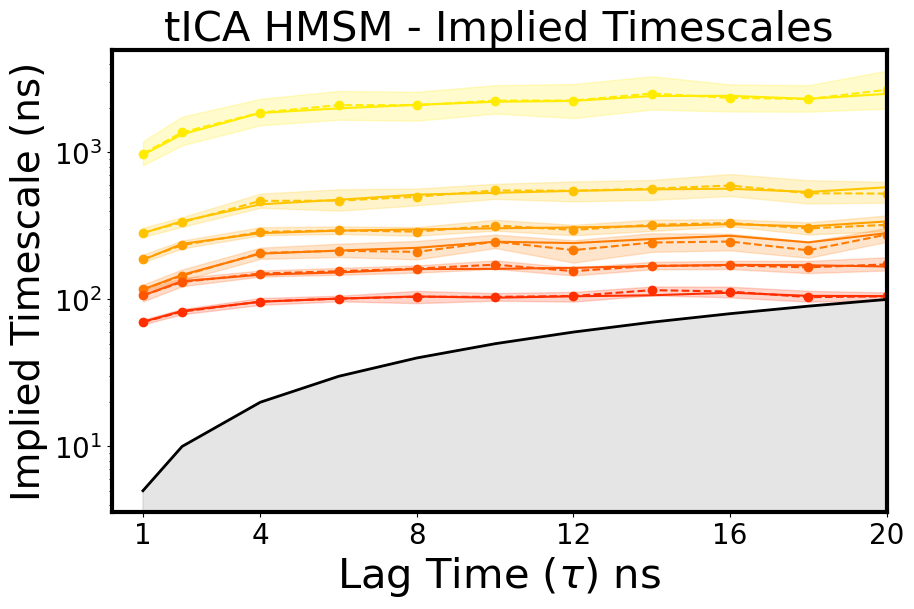

In [10]:
#initial clustering

# n_clusters = 12
# dtraj_cl = K(n_clusters=n_clusters,init='k-means++').fit_predict(proj[:,:3])

dtraj_cl = d_tica["dtraj.HMSM"] #already computed clusters
lags = np.array([5]+list(range(10,130,10)))
its = pyemma.msm.timescales_hmsm(
        dtraj_cl, n_HMSM_states, lags=lags, nsamples=60, errors="bayes", n_jobs = 1)
fig,ax = plt.subplots(1,1, figsize = (10,6))
plot_implied_timescales(its,units="ns", ax=ax)
ax.set_yscale("log")
ax.set_xticks(lags[::2],(lags*.2).astype(int)[::2])
ax.set_xlabel(r"Lag Time ($\tau$) ns",size=30)
ax.set_ylabel("Implied Timescale (ns)",size=28)
ax.set_xlim(1,lags[-3])
ax.set_title("tICA HMSM - Implied Timescales",size=30)
ax.tick_params("both", labelsize=20)
plt.show()

 # Let's visualize the state assignments at longer lags to make sure we're consistently getting the same states using HMSM coarse graining
 
 # Here we estimate HMSM at multiples of the most promising lag time based on the ITS plot (shortest lagtime at which we have convergence)
 
 # note that pyemma estimates MSMs in terms of trajectory steps and not physical times

Sampling HMSMs:   0%|                                                                                         …

Sampling HMSMs:   0%|                                                                                         …

Sampling HMSMs:   0%|                                                                                         …

Sampling HMSMs:   0%|                                                                                         …

Sampling HMSMs:   0%|                                                                                         …

Sampling HMSMs:   0%|                                                                                         …

<Figure size 640x480 with 0 Axes>

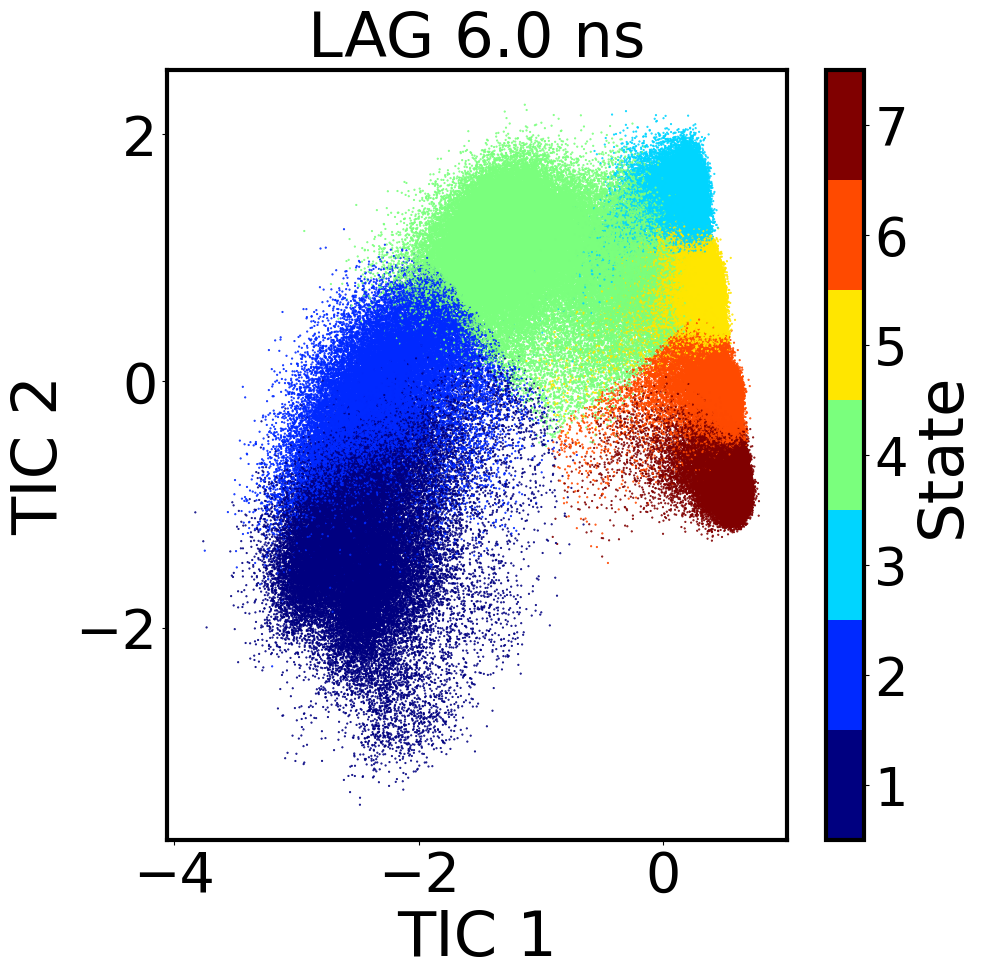

<Figure size 640x480 with 0 Axes>

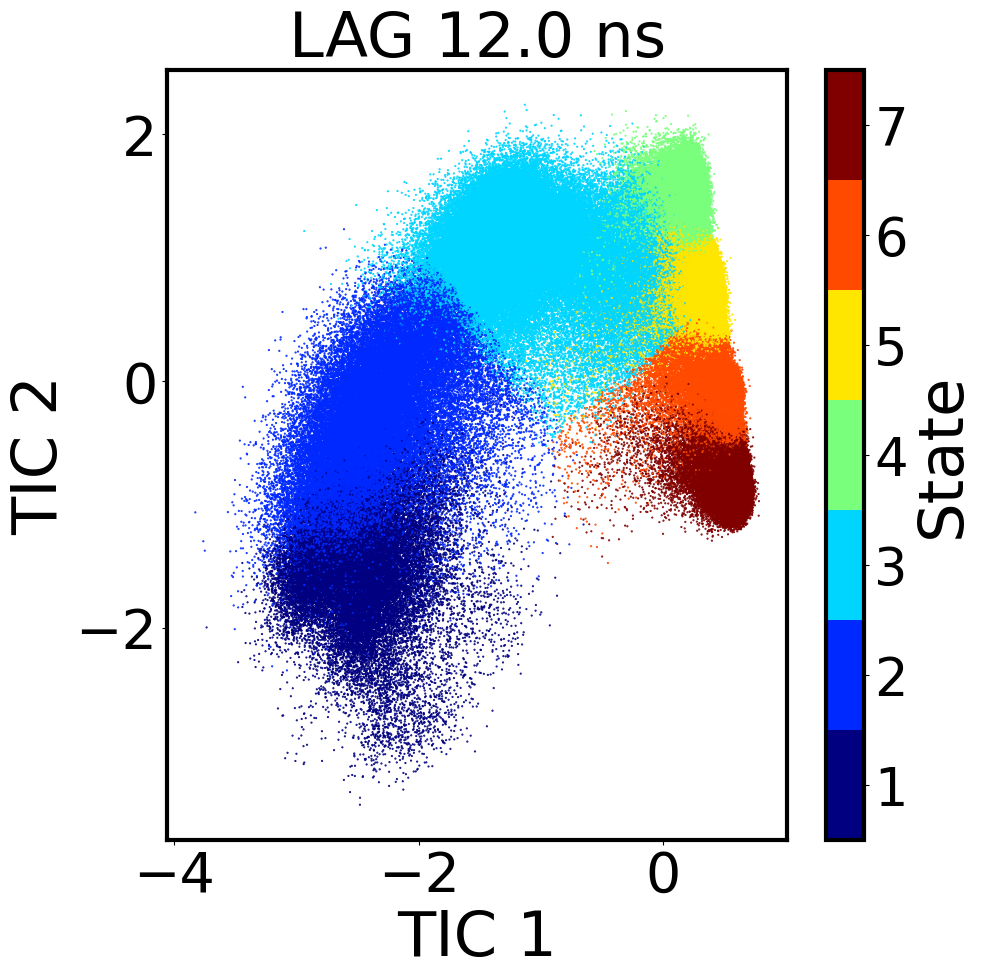

<Figure size 640x480 with 0 Axes>

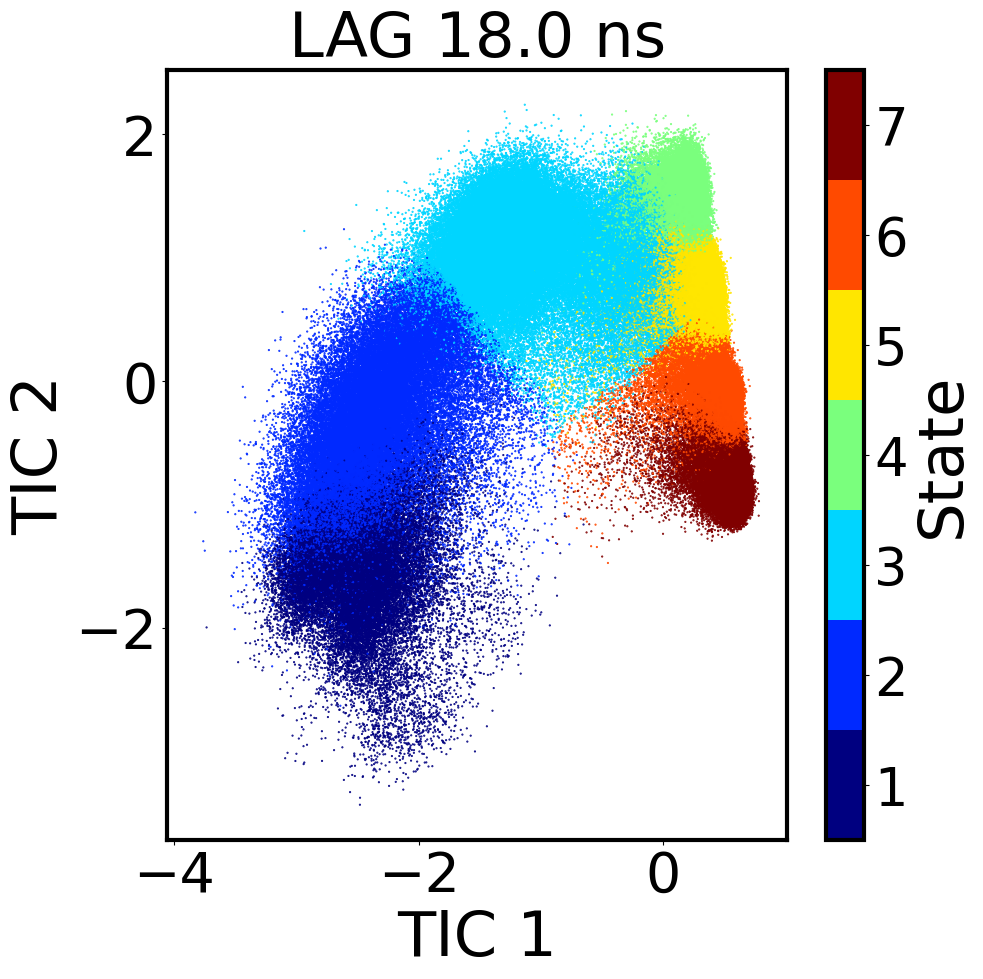

<Figure size 640x480 with 0 Axes>

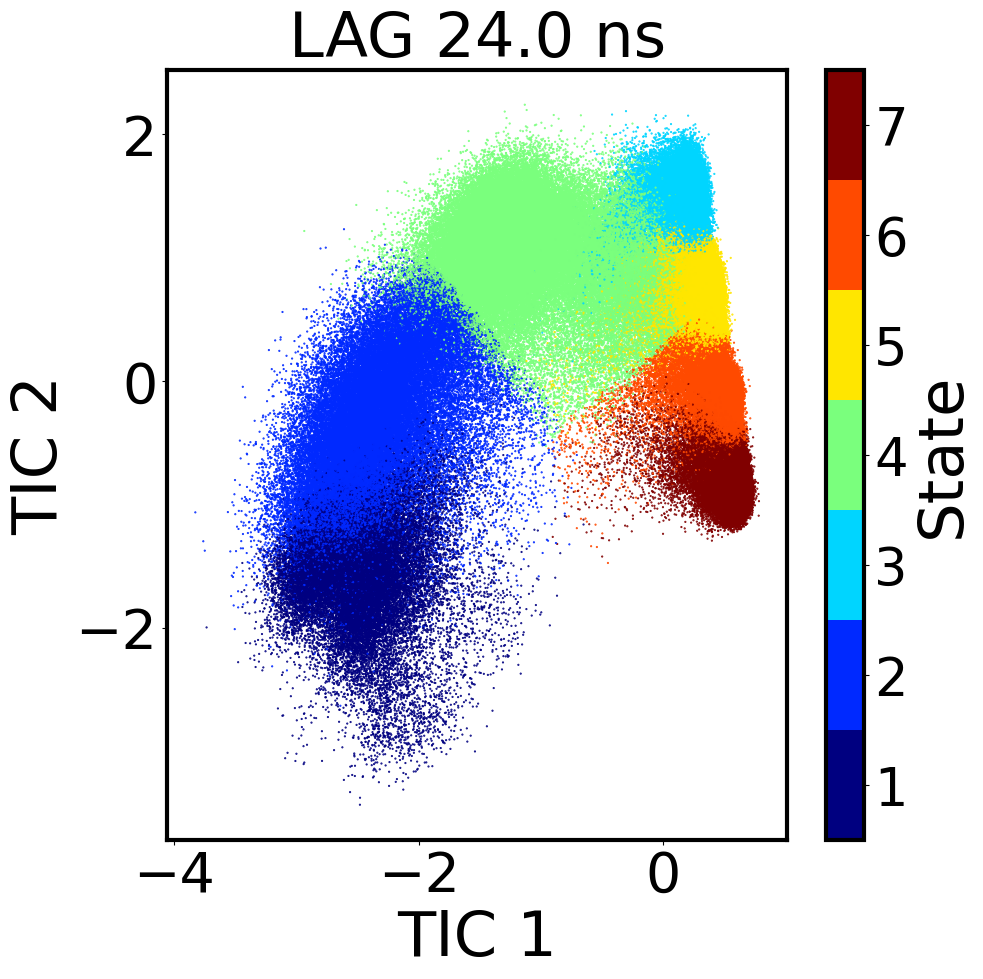

<Figure size 640x480 with 0 Axes>

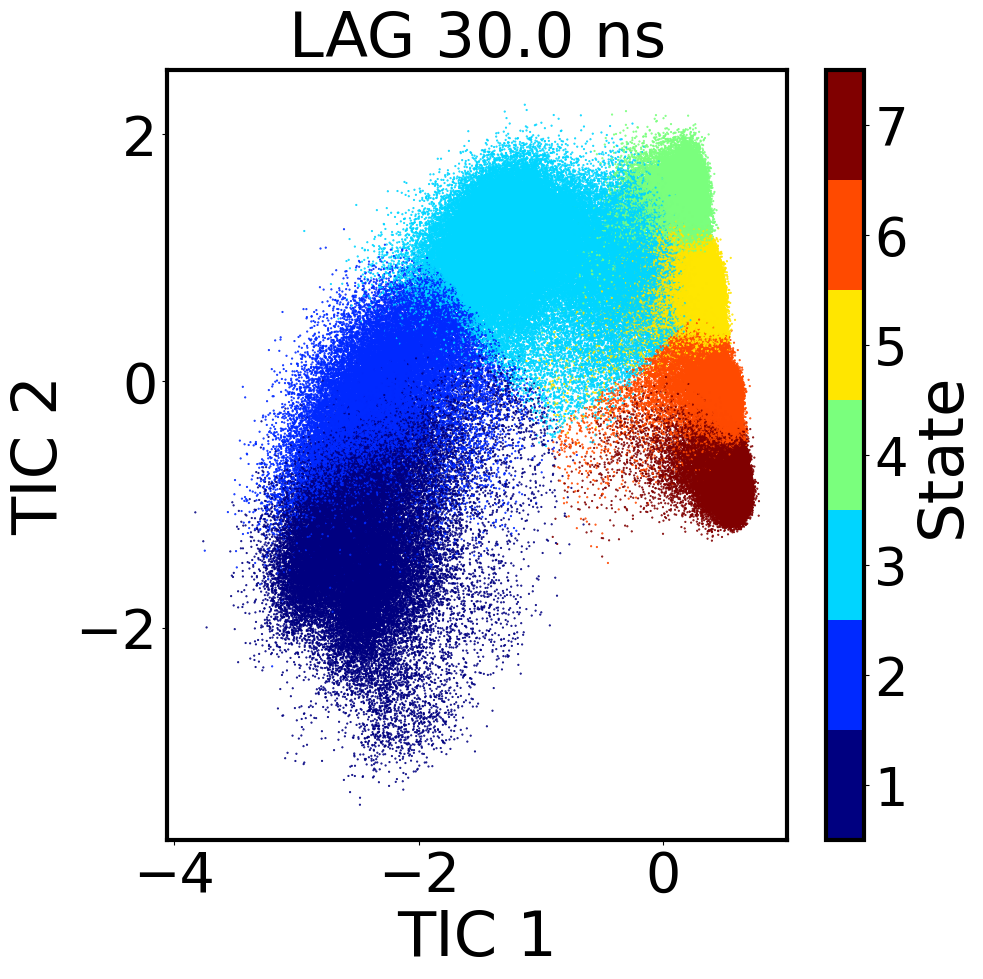

<Figure size 640x480 with 0 Axes>

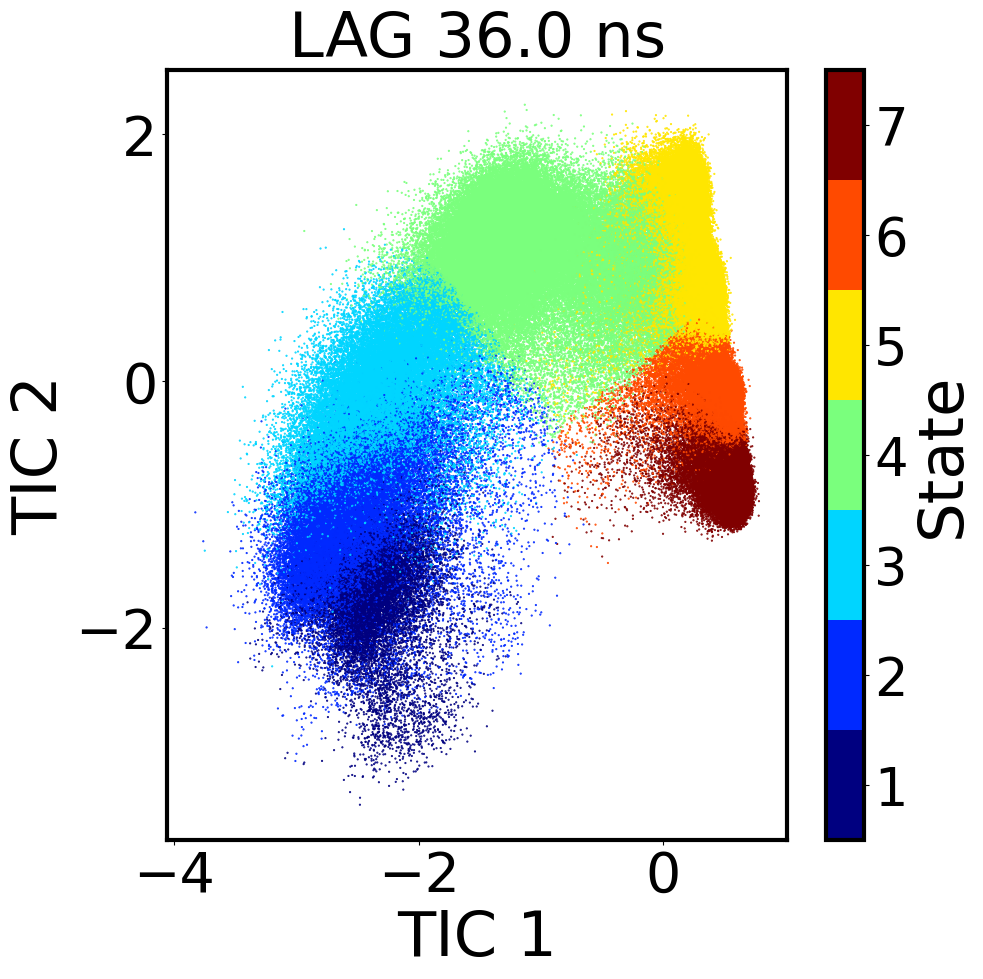

In [11]:
dtrajs = []
tmats = []
lagtime = 30
n_HMSM_states = 7
# dtraj_cl_ = reorder(dtraj_cl, q)[0]
for lag in range(1,7):
    plt.figure()
    hmm_test = pyemma.msm.bayesian_hidden_markov_model(dtraj_cl,n_HMSM_states, lag=lag*lagtime, dt_traj='.2 ns',
                                                       nsamples=100)
    if lag == 1:
        hmm = hmm_test #save the test model i.e the one with the lag time we are estimating at multiples of
    hmm_dtraj_test = hmm_test.metastable_assignments[dtraj_cl]
    tmats.append(hmm_test.transition_matrix)
    dtrajs.append(hmm_dtraj_test)
    state_map2d(proj, hmm_dtraj_test, f"LAG {lagtime*lag*.2} ns", comp_type = "TIC")
tmats = np.array(tmats)

 # states switch indices when estimating at longer lags
 
 

# Let's reindex all of the transition matrices (corresponding to the state maps above) estimated at integer multiples of the lagtime and then propogate the test transition matrix ourselves.

 

In [12]:
#reindex discrete trajectories and get reindexing vectors
dtrajs_reidx, new_idx = []*2
for i in dtrajs[:-1]:
    dtraj_reidx_, new_idx_ = reindex_dtraj(i, d_tica["dtraj"], maximize_obs = False) #reindex based on first tica model cluster assignments
    dtrajs_reidx.append(dtraj_reidx_); new_idx.append(new_idx_)

tmats_reidx = [reindex_matrix(i,j) for i,j in zip(tmats[:-1], new_idx)] #reindex transition matrices
#compute error estimates and reindex
ck = hmm.cktest(n_HMSM_states)
predictions_conf = [i[1:-1] for i in ck.predictions_conf]
predictions_conf = [np.concatenate([np.expand_dims(np.eye(n_HMSM_states), axis=0), reindex_matrix(i,new_idx[0])])
                    for i in predictions_conf]

estimating BayesianHMSM:   0%|                                                                                …

/home/t/miniconda3/lib/python3.8/site-packages/pyemma/util/statistics.py:59: UserWarning: confidence interval for constant data is not meaningful
  warnings.warn('confidence interval for constant data is not meaningful')


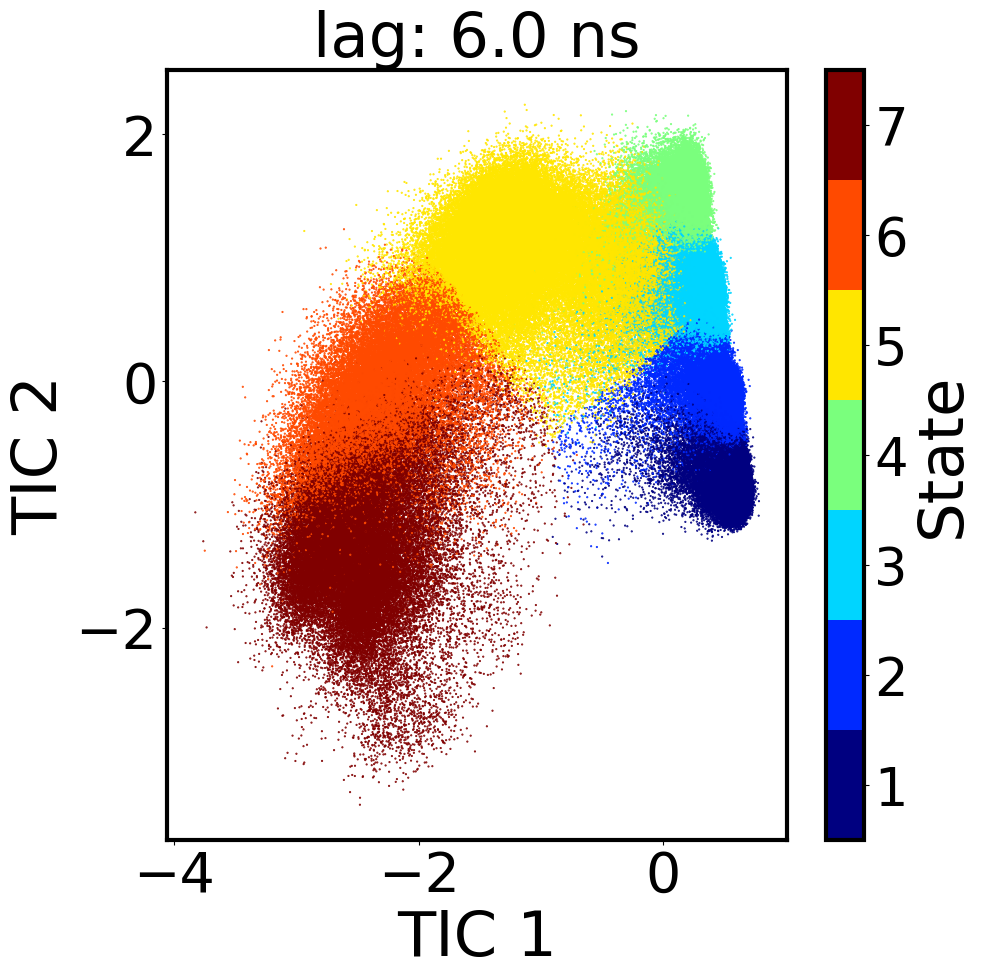

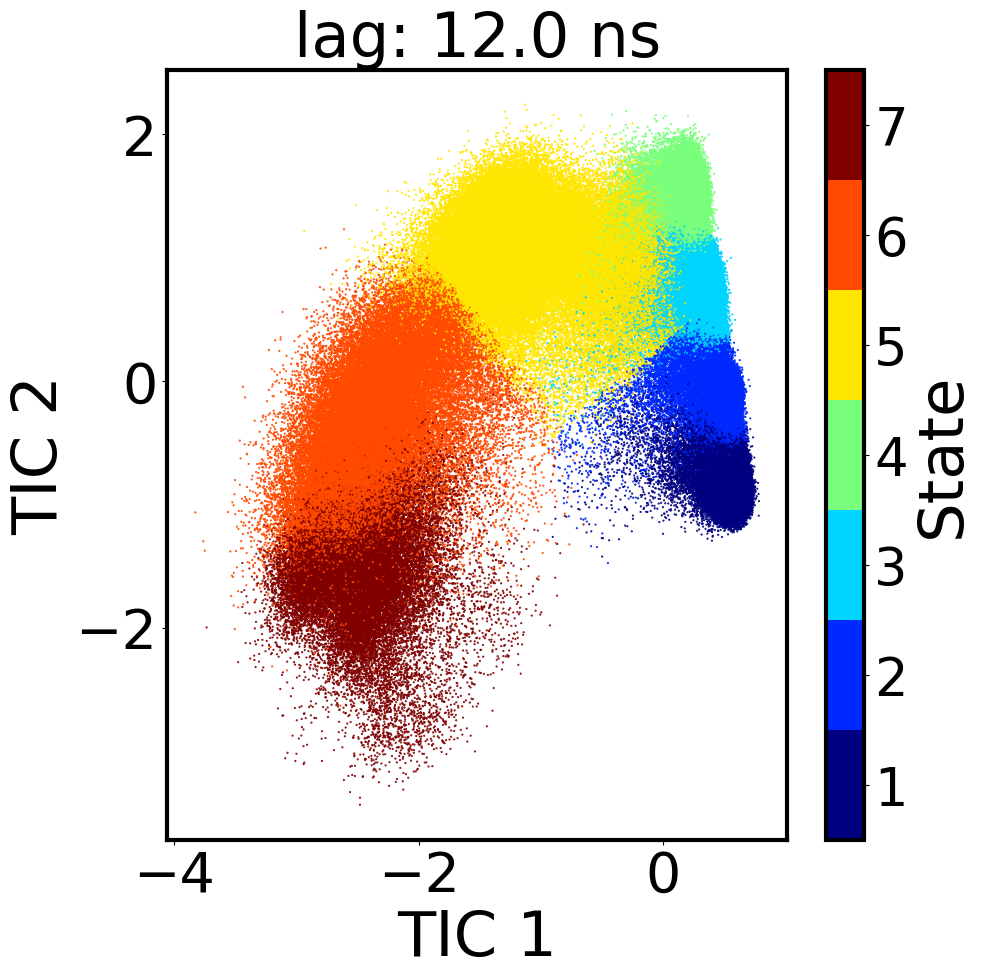

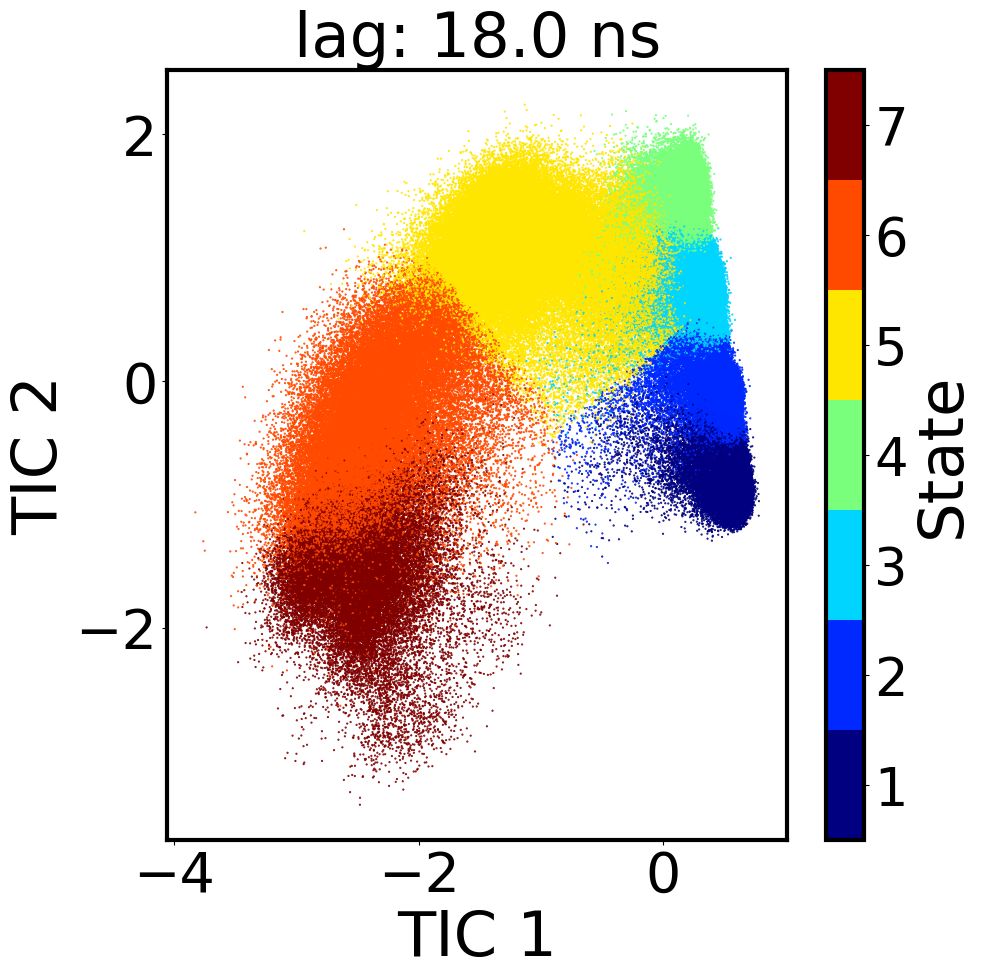

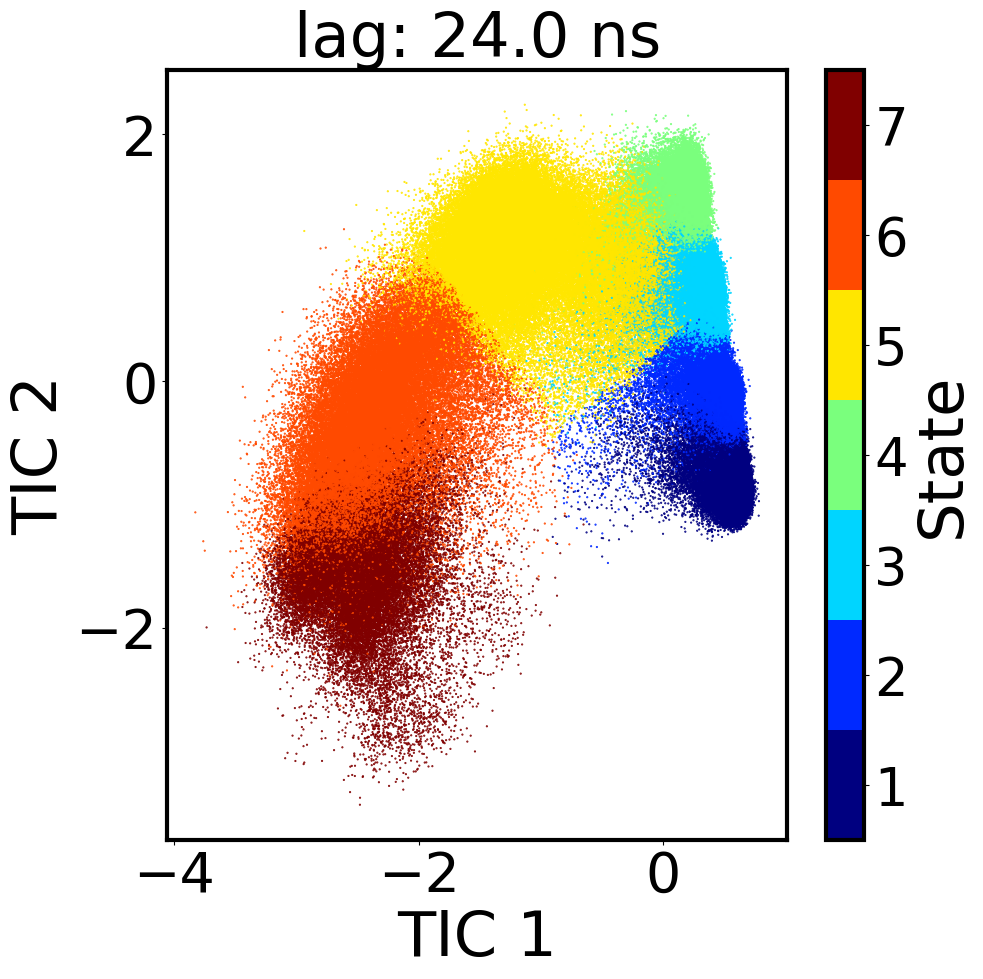

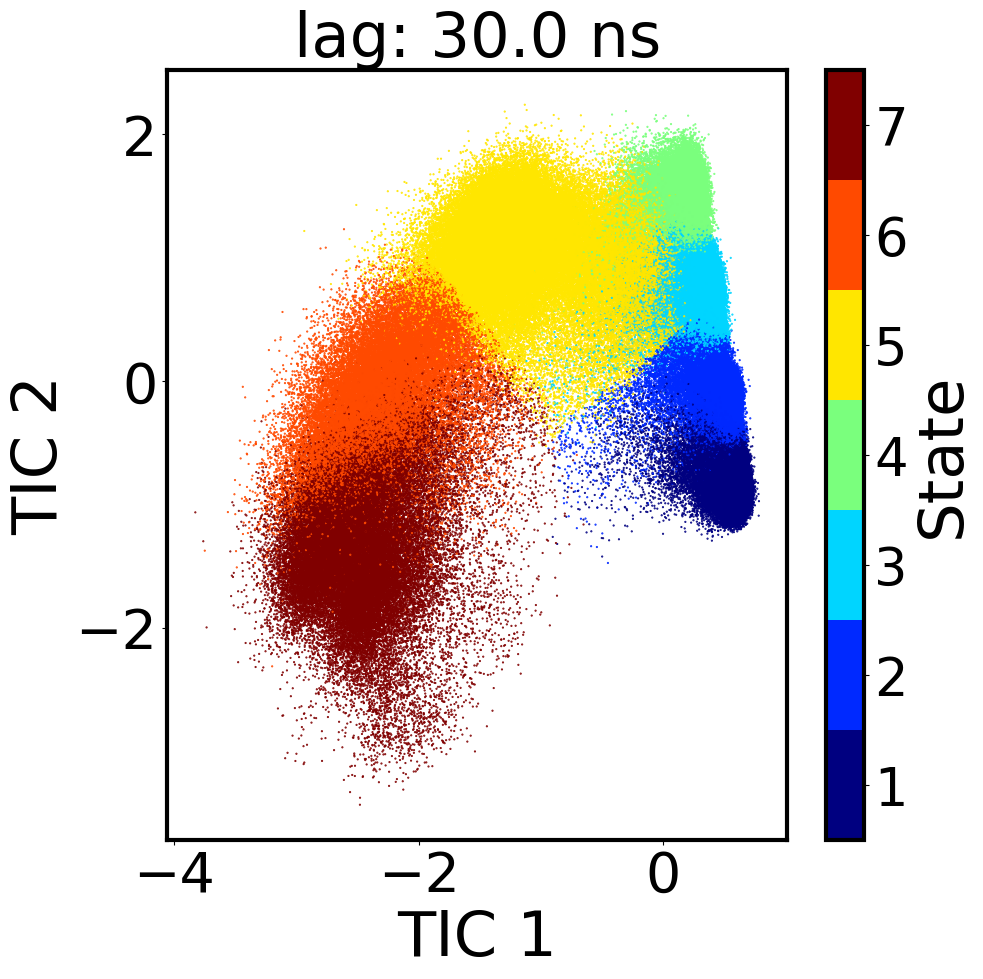

In [13]:
#let's check all the state maps that we reindexed for consistency
for i, j in enumerate(dtrajs_reidx):
    state_map2d(proj, j, comp_type = "TIC", title = f"lag: {(i+1)*30*.2} ns")

 # We also have to plot the CK-test ourselves as the pyemma software does everything using it's cktest object 

In [32]:
def plot_cktest(predict:np.ndarray, estimate:np.ndarray,lagtime:int, dt:float,
                predict_color = "red", estimate_color = "black", predict_errors = None): 
    
    """predict errors should be of shape [2,predict/estimate.shape] where the 0th dim is upper and lower
    confidence intervals"""
    
    nsteps, nstates = predict.shape[:2]
    fig,axes = plt.subplots(nstates,nstates,figsize=(12,12),sharex=True,sharey=True)
    dt_lag = np.arange(nsteps)*lagtime*dt
    xaxis_marker = np.linspace(0,1,nsteps)
    padding_between=0.15; padding_top=0.065
    
    predict_label = "Predict"

    for i in range(nstates):
        for j in range(nstates):
            if not predict_errors is None: 
                axes[i,j].fill_between(dt_lag, predict_errors[0][:, i, j], predict_errors[1][:, i, j],
                                color=predict_color, alpha=0.2)
                predict_label +="      conf. 95%"
            
            axes[i,j].plot(dt_lag, predict[:,i,j], ls = "--", color = predict_color, label = predict_label)

            axes[i,j].plot(dt_lag,estimate[:,i,j], label="Estimate", color = estimate_color)

            axes[i,j].set_ylim(0,1)
            axes[i,j].text(0.1, 0.55, str(i+1)+' ->'+str(j+1),
                           transform=axes[i,j].transAxes, weight='bold', size=12)
            axes[i,j].set_yticks([0,.5,1], ["0", "0.5", "1"],size=12 )
            axes[i,j].set_xticks(dt_lag[[1,-1]],dt_lag[[1,-1]],)

    for axi in axes.flat:
        axi.set_xlabel(None)
        axi.set_ylabel(None)

    fig.supxlabel("Lagtime (ns)",x=0.5,y=.05,size = 25)
    fig.supylabel("Probability",x=.06,y=.5,size = 25)  
    handels, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handels, labels, ncol=7,loc="upper center", frameon=False,prop={'size': 25})
    plt.subplots_adjust(top=1.0-padding_top, wspace=padding_between, hspace=padding_between)

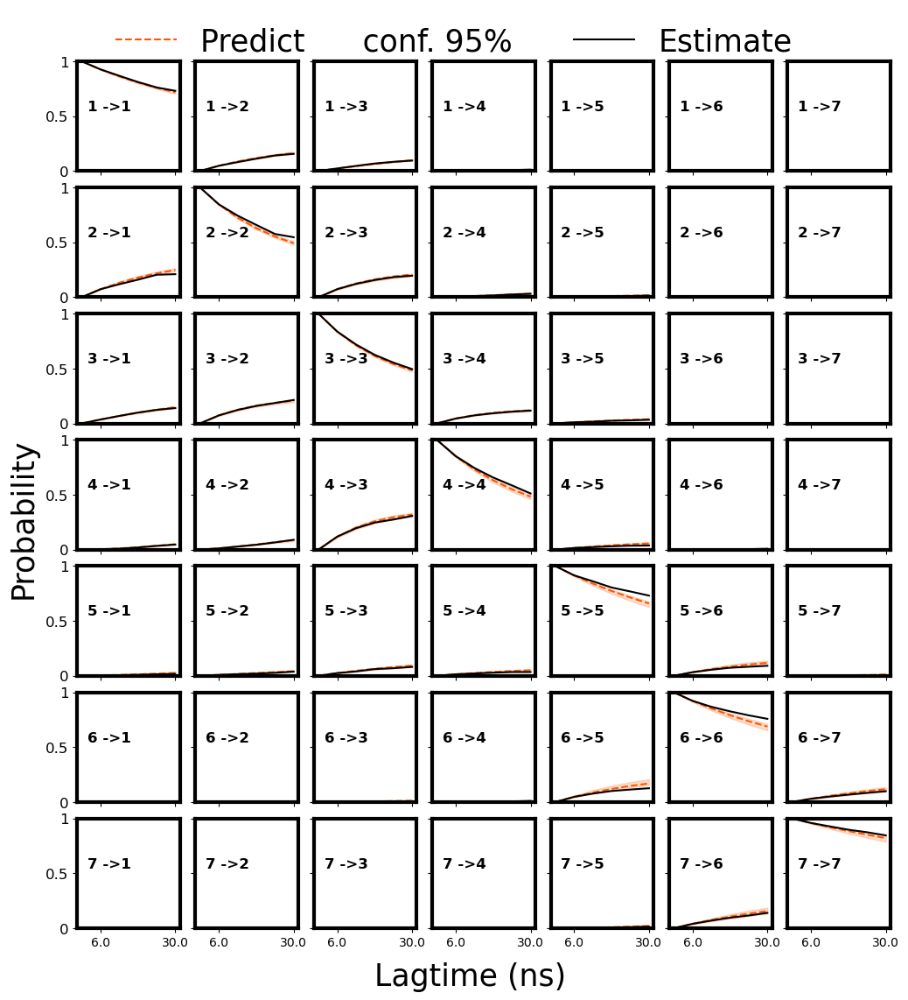

In [33]:
predict, estimate = cktest(tmats_reidx)
plot_cktest(predict, estimate, lagtime = 30, dt = .2,predict_errors = predictions_conf,
            predict_color = clist[4])

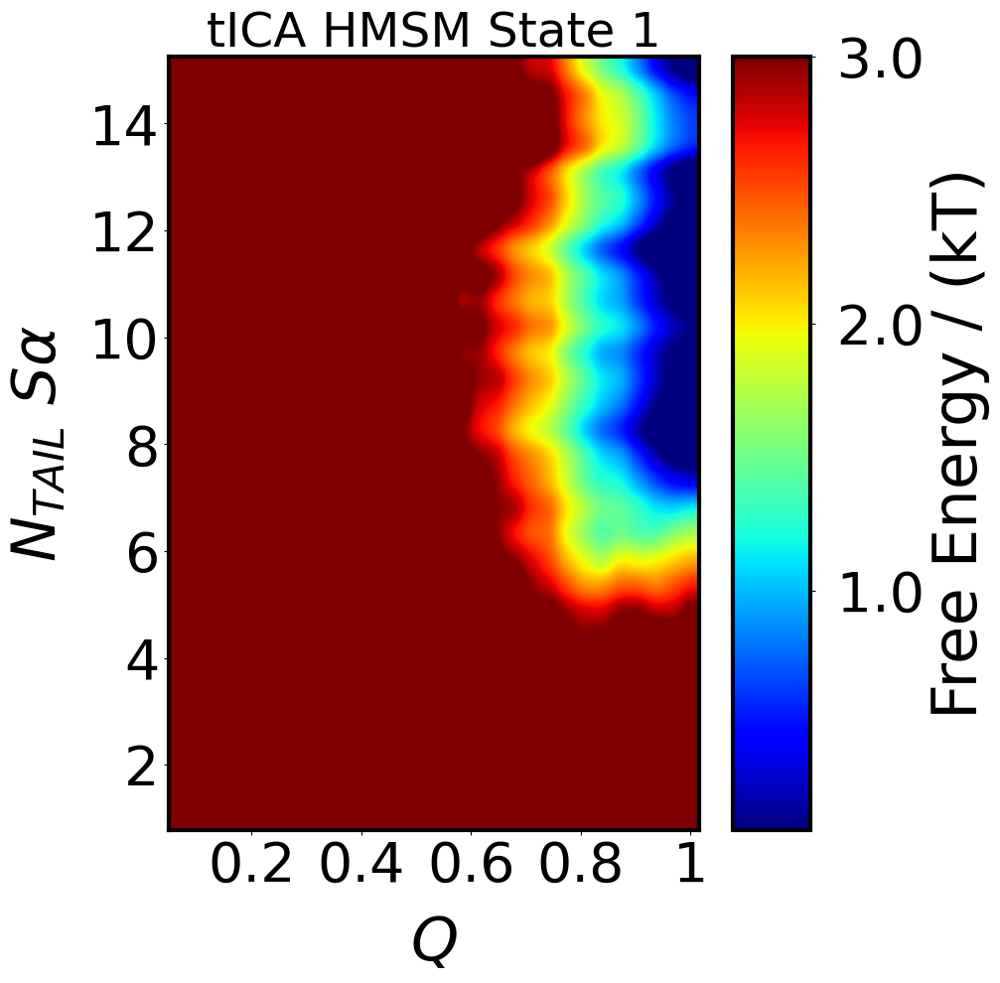

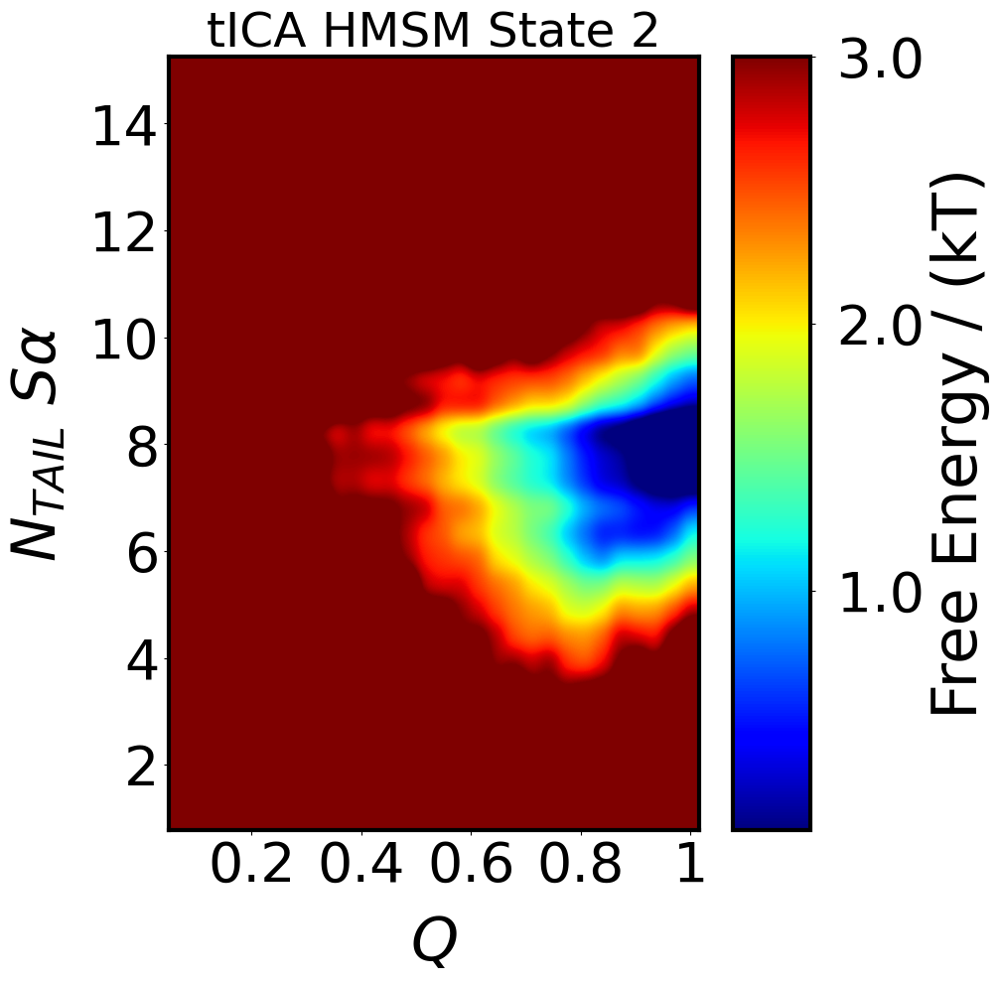

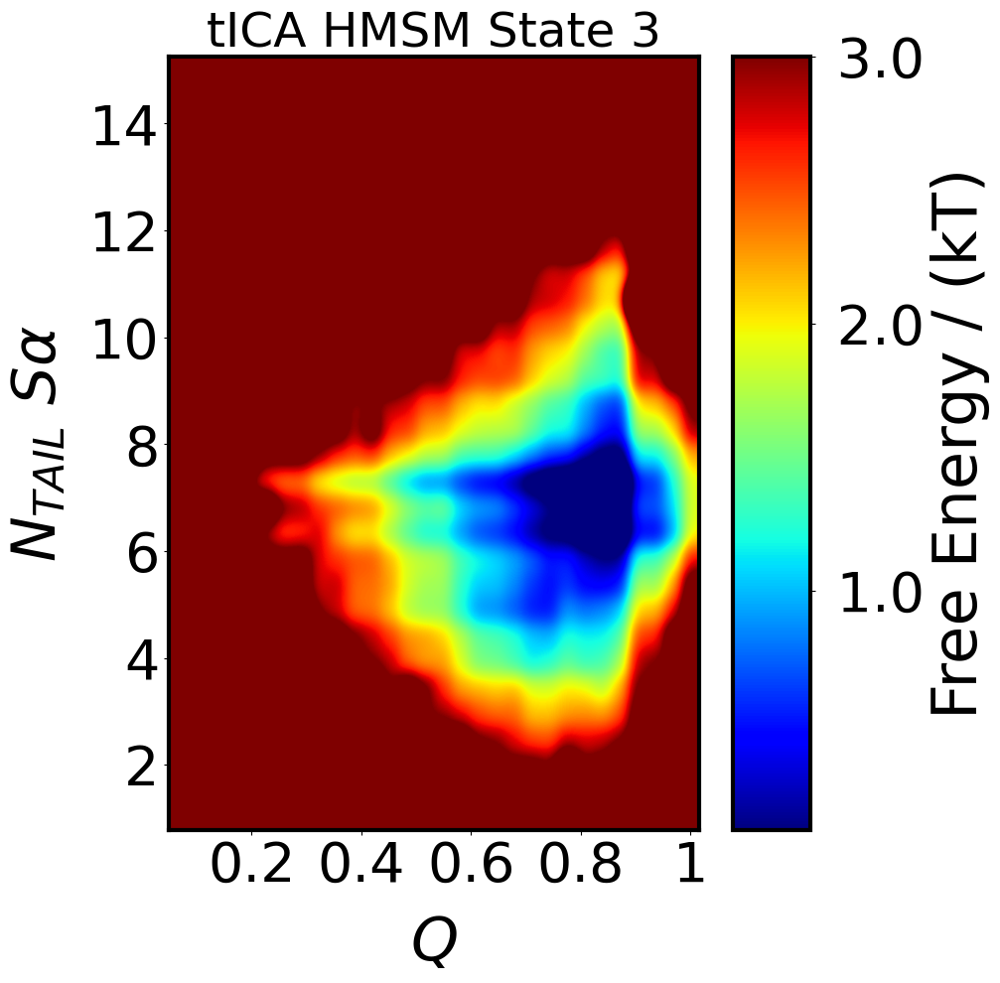

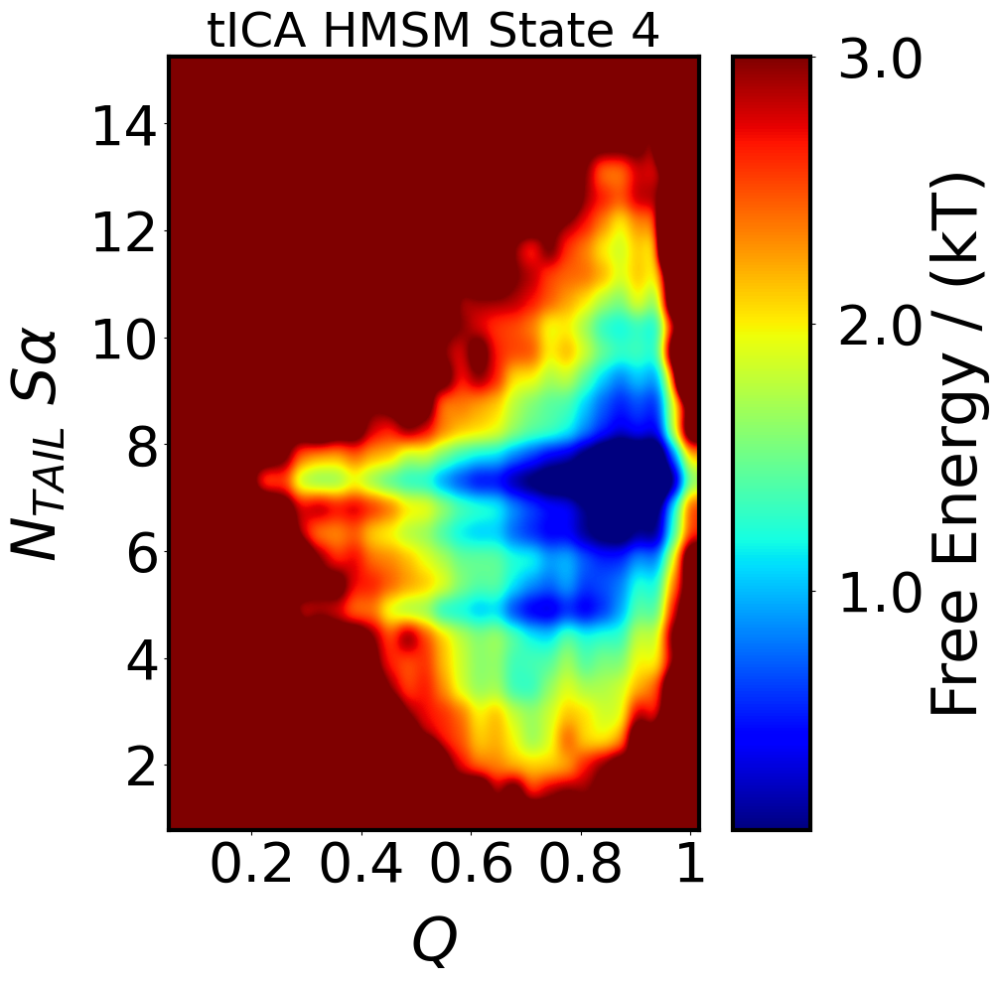

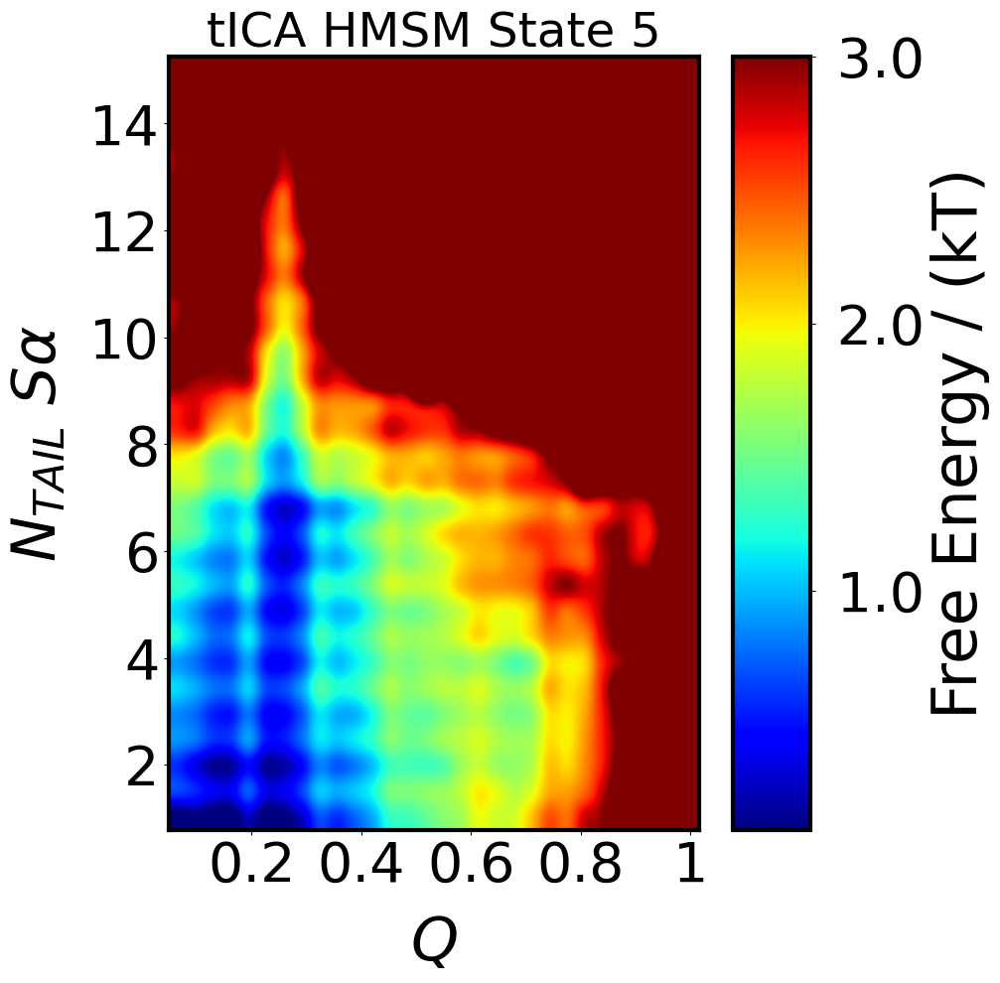

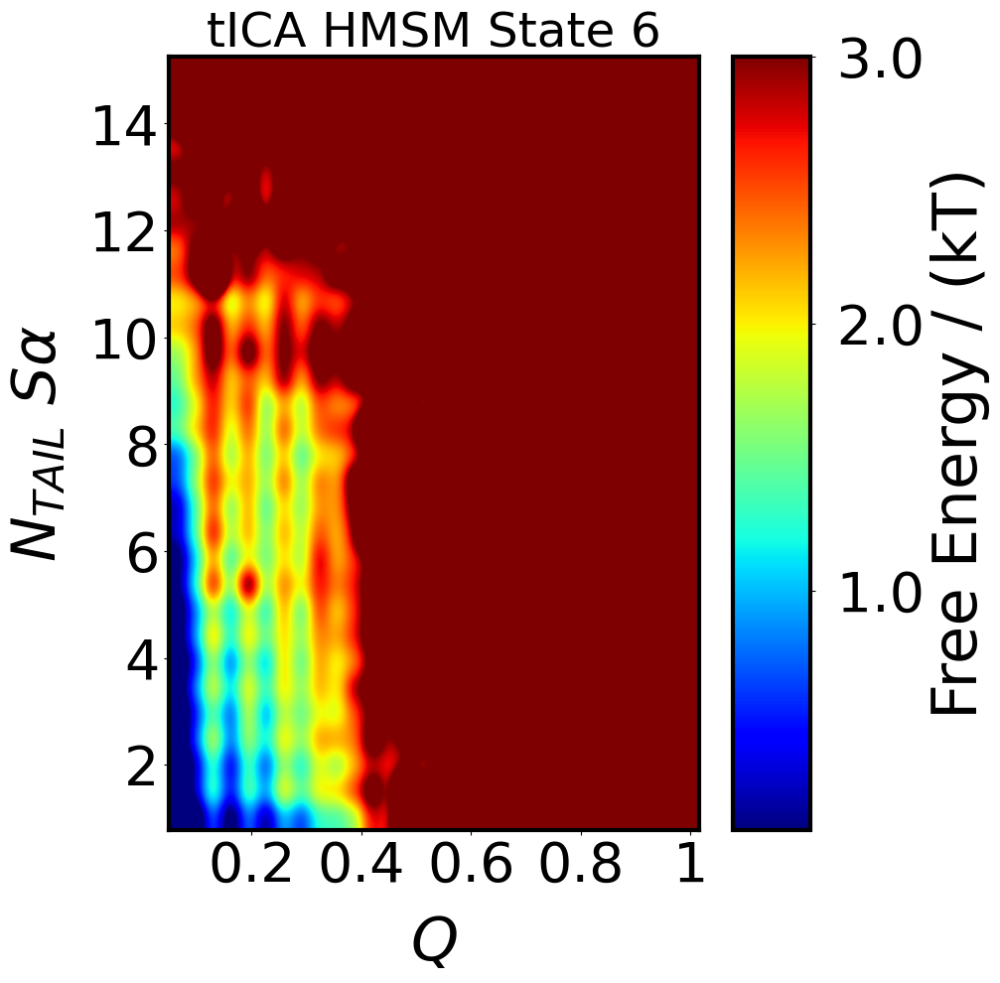

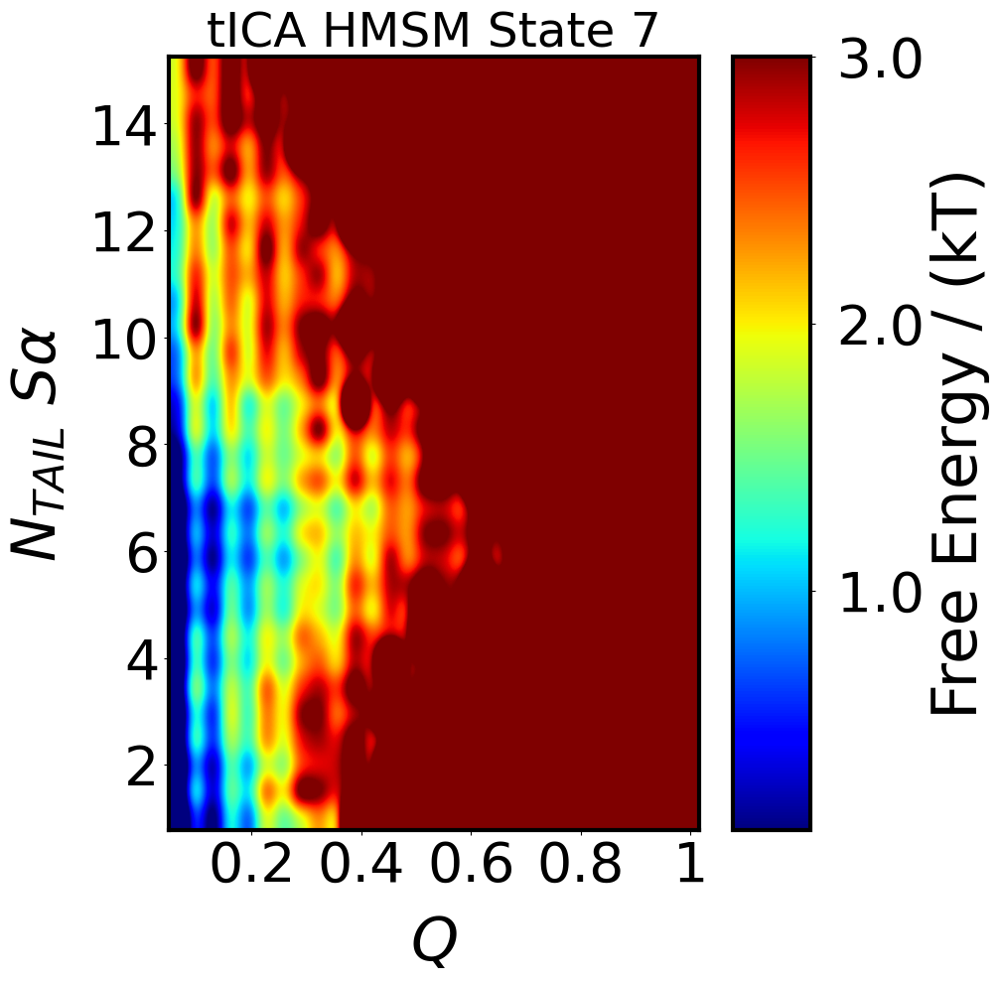

In [37]:
frames_cl = [np.where(dtrajs_reidx[0] == i)[0] for i in range(7)]


y_centers, x_centers = [i[1:] + np.diff(i)/2 for i in np.histogram2d(x = d_tica["Sa_total"], y = d_tica["QP"], bins = 30)[1:]]
histograms = np.stack([np.flipud(np.histogram2d(x = d_tica["Sa_total"][i], y = d_tica["QP"][i], bins = 30, normed = True)[0]) for i in frames_cl])

for i in range(7):
    plot_free_energy(hist2d = histograms[i],T = 300,
                    title = f"tICA HMSM State {i+1}",
                    xlabel = r"$Q$",
                    ylabel = r"$N_{TAIL}$ $S\alpha$",
                    x_centers = x_centers,
                    y_centers = y_centers)



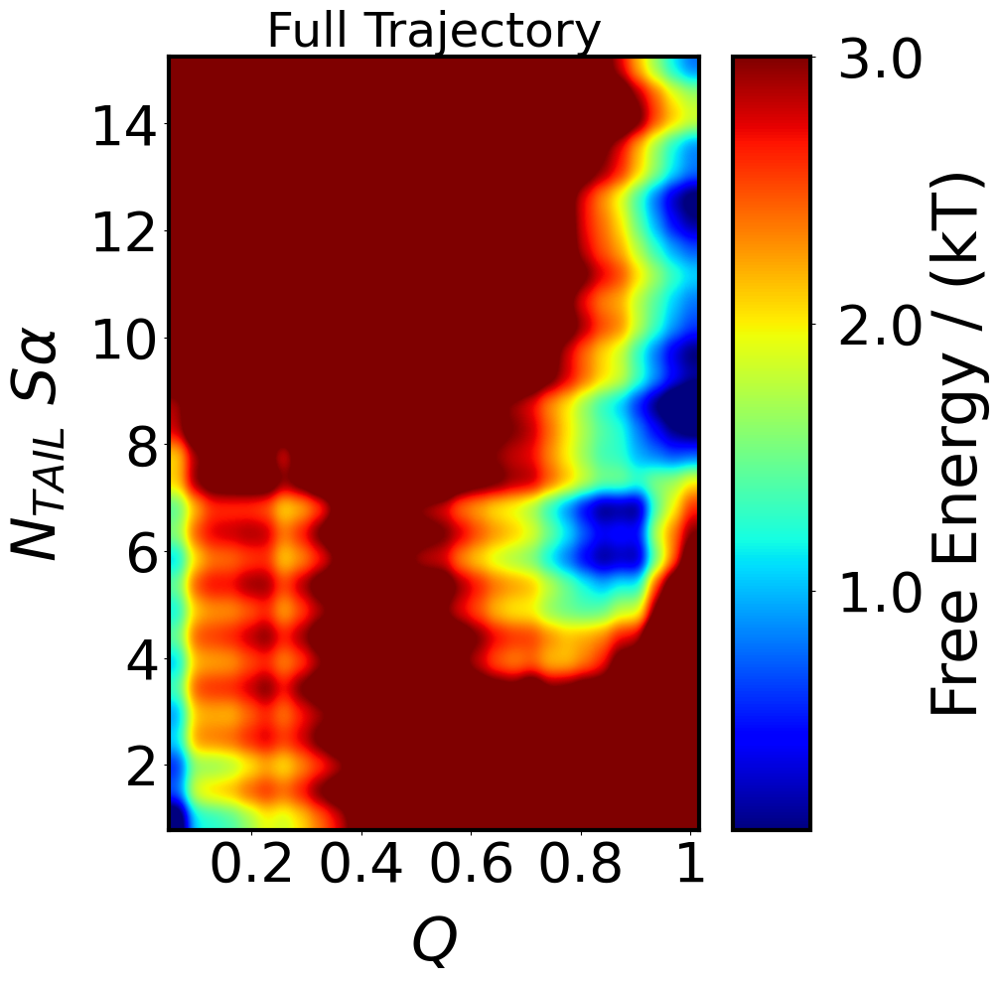

In [38]:
histogram = np.flipud(np.histogram2d(x = d_tica["Sa_total"], y = d_tica["QP"], bins = 30, normed = True)[0])
plot_free_energy(hist2d = histogram,T = 400,
                title = f"Full Trajectory",
                xlabel = r"$Q$",
                ylabel = r"$N_{TAIL}$ $S\alpha$",
                x_centers = x_centers,
                y_centers = y_centers)

/home/t/miniconda3/lib/python3.8/site-packages/pyemma/util/statistics.py:59: UserWarning: confidence interval for constant data is not meaningful
  warnings.warn('confidence interval for constant data is not meaningful')


(0.5, 7.5)

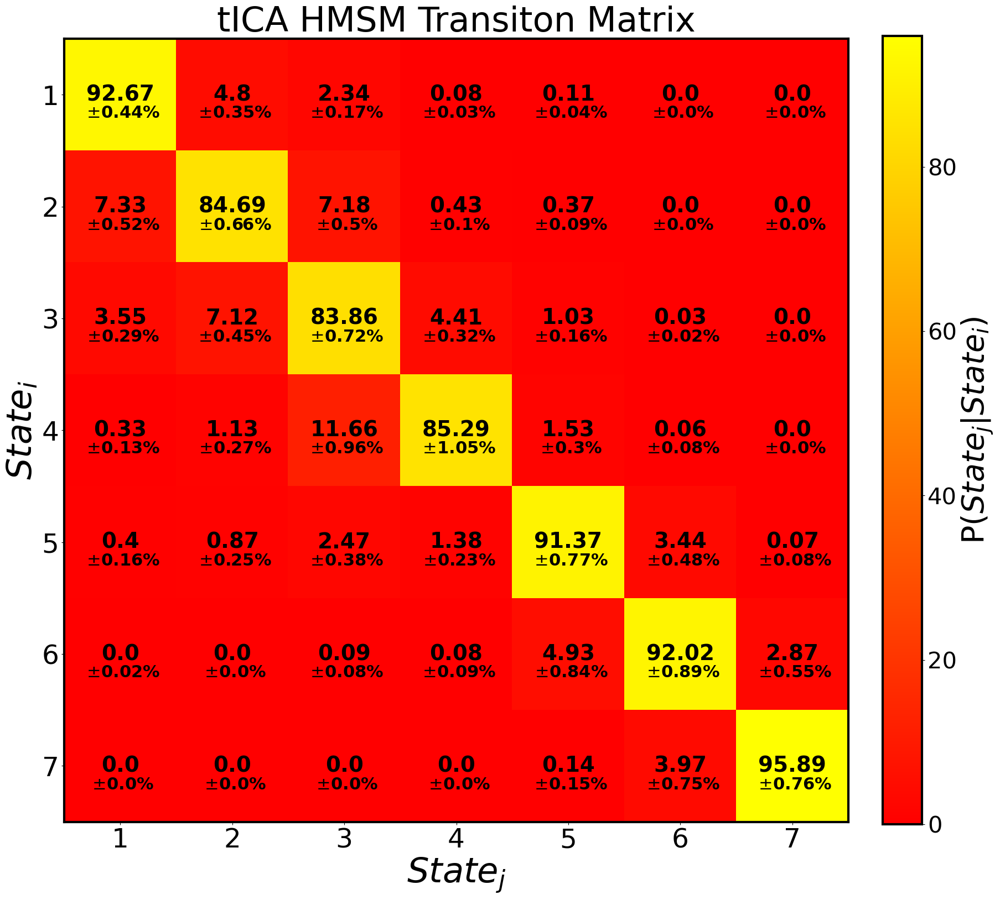

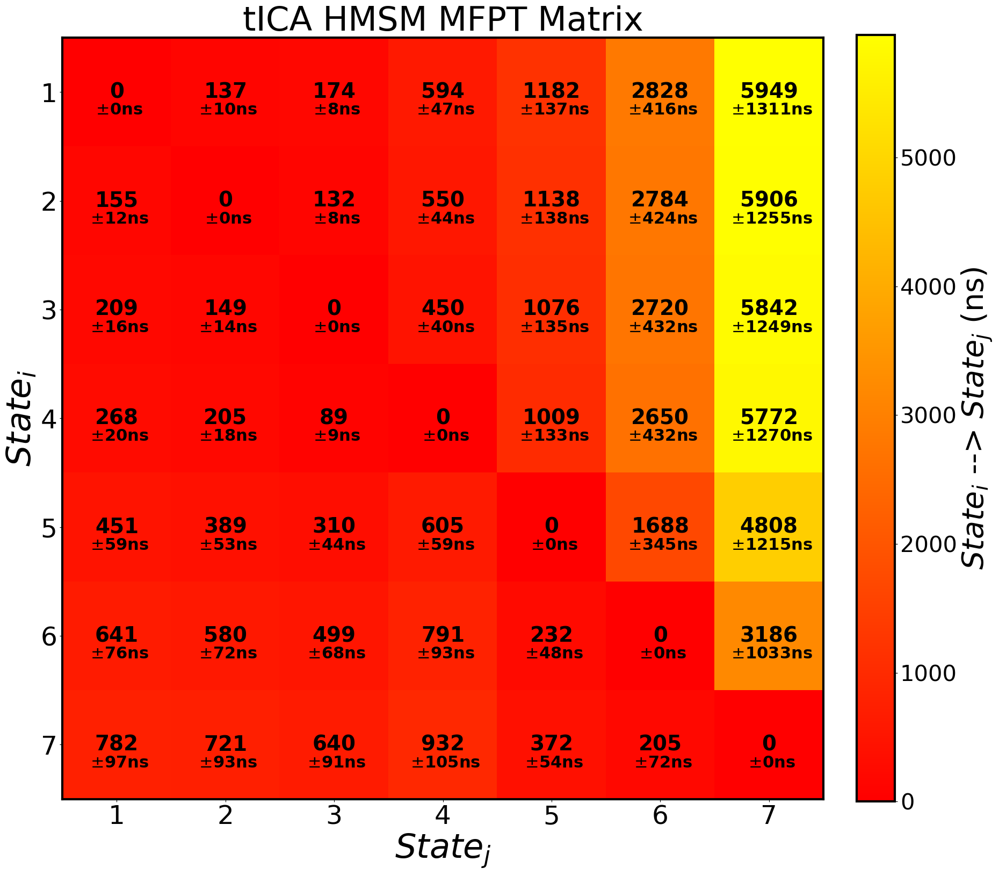

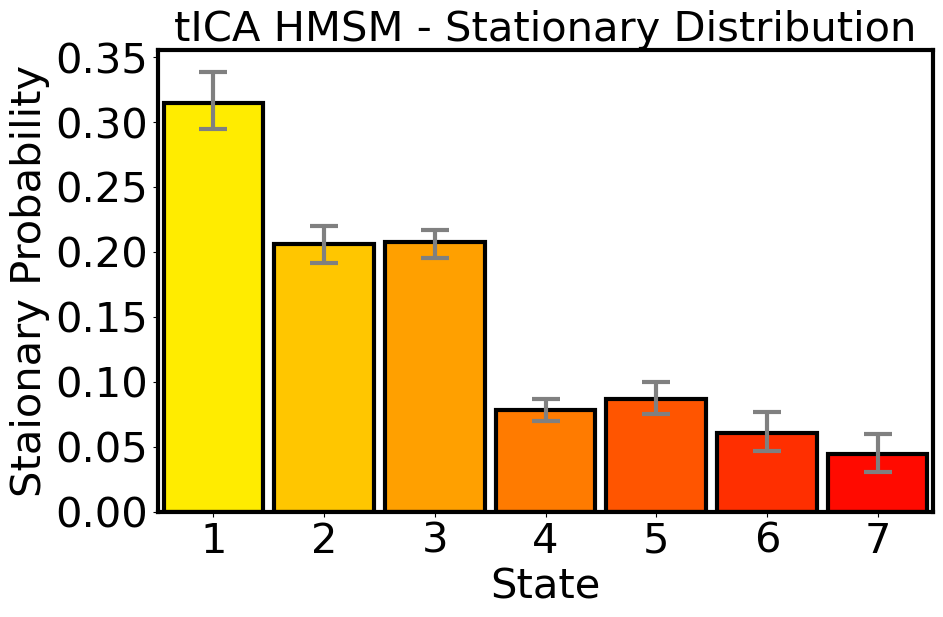

In [51]:
#transition matrix
bmsm = hmm #lazy 
tmat_l,tmat_r = bmsm.sample_conf("transition_matrix")
tmat = bmsm.sample_mean("transition_matrix")
rel_tmat_error = (abs(tmat-tmat_l)+abs(tmat-tmat_r))/2
tmat *= 100
rel_tmat_error *= 100
tmat,rel_tmat_error  = [reindex_matrix(i, new_idx[0]) for i in [tmat, rel_tmat_error]] #reindex

plot_mat_error(mat = tmat,emat = rel_tmat_error,title = "tICA HMSM Transiton Matrix",unit = "%",
               cbarlabel = r"P($State_{j}$|$State_{i}$)", val_text_size = 28, err_text_size = 22,
               textcolor = "black",
               cmap = "autumn",ticklabs = ticklabs)



#mfpt matrix
mfpt_error = np.zeros((7,7))
mfpt_mean = np.zeros((7,7))
for i in range(7):
    for j in range(7):
        mean = bmsm.sample_mean("mfpt", i,j)
        mfpt_mean[i,j] = mean
        l,r = np.array(bmsm.sample_conf("mfpt", i,j))
        mfpt_error[i,j] = (abs(mean-r)+abs(mean-l))/2
mfpt_mean,mfpt_error  = [reindex_matrix(i, new_idx[0]) for i in [mfpt_mean,mfpt_error]] #reindex

plot_mat_error(mat = mfpt_mean,emat = mfpt_error,title = "tICA HMSM MFPT Matrix",unit = "ns",
               cbarlabel = r"$State_{i}$ --> $State_{j}$ (ns)",val_text_size = 28, 
               err_text_size = 22,textcolor = "black",cmap = "autumn",
               ticklabs = ticklabs, round_int = True)


#stat dist

#stationary distribution errors
stat_error_l,stat_error_r = bmsm.sample_conf("stationary_distribution") #this estimate has the mean added to it
#above is a computation of the 95% confidence interval
stat_dist_mean = bmsm.sample_mean("stationary_distribution")
stat_dist_error = abs(np.stack([stat_error_l,stat_error_r]) - stat_dist_mean)

stat_dist_mean = stat_dist_mean[new_idx[0]]
stat_dist_error = stat_dist_error[:,new_idx[0]]
plt.figure(figsize = (10,6))
plt.bar(np.arange(1,8),stat_dist_mean,yerr = stat_dist_error,
        ecolor="grey",color=clist,capsize=10,width=.9,linewidth=3, edgecolor = "black",
        align="center",error_kw=dict(capthick=3,lw=3))
plt.xticks(np.arange(1,8), ticklabs)
plt.xlabel("State", size=30)
plt.ylabel("Staionary Probability", size=30)
plt.title("tICA HMSM - Stationary Distribution",size = 30)
plt.xticks(size = 30)
plt.yticks(size = 30)
plt.xlim(.5,7.5)

 # Characterization of the clusters derived from HMM

In [34]:
#load in mdtrajectory
pdb = "/home/t/msm/ntxd/strucs/Ntail.XD.protein.pdb"
trajectory = "/home/t/msm/ntxd/trajs/traj_trunc.dcd"
helix = md.load("/home/t/msm/ntxd/strucs/Ntail.helix.pdb").center_coordinates()
native_trajectory = "/home/t/msm/ntxd/trajs/ntxd.native.dcd"
#fix topology
table,bonds = md.load(pdb).topology.to_dataframe()
table.loc[table["chainID"]==4,"chainID"]=0
table.loc[table["chainID"]>1,"chainID"]=1
top = md.Topology.from_dataframe(table,bonds)

In [35]:
d_tica["dtraj"] = dtrajs_reidx[0].astype(int)
tica_model = model(d_tica,trajectory, native_trajectory, pdb, top, 120, .2, "ns") #just using my model object to handel data, msm part doesn't matter

Please Enter a CSV string of state lables: 1,2,3,4,5,6,7


/home/t/Downloads/msmtool.py:450: RuntimeWarning: divide by zero encountered in log
  F=-np.log(arr)


In [39]:
for j,frames in enumerate(frames_cl):
    print(f"State {j+1} -- Qave : {d_tica['QP'][frames].mean()},  Qsd : {d_tica['QP'][frames].std()}, SAave : {d_tica['Sa_total'][frames].mean()}, SAsd : {d_tica['Sa_total'][frames].std()}")

State 1 -- Qave : 0.9346674084663391,  Qsd : 0.07390146702528, SAave : 10.925844192504883, SAsd : 1.8954709768295288
State 2 -- Qave : 0.9107974767684937,  Qsd : 0.10119033604860306, SAave : 7.715081214904785, SAsd : 0.7625433802604675
State 3 -- Qave : 0.7892034649848938,  Qsd : 0.09944958239793777, SAave : 5.637395858764648, SAsd : 0.8406721949577332
State 4 -- Qave : 0.7756227850914001,  Qsd : 0.10782436281442642, SAave : 4.770299911499023, SAsd : 0.9257892370223999
State 5 -- Qave : 0.2217845469713211,  Qsd : 0.15988627076148987, SAave : 3.0525248050689697, SAsd : 2.3802106380462646
State 6 -- Qave : 0.025389859452843666,  Qsd : 0.05397481098771095, SAave : 1.7422271966934204, SAsd : 2.1940977573394775
State 7 -- Qave : 0.02085762284696102,  Qsd : 0.044841378927230835, SAave : 3.518925189971924, SAsd : 2.7980399131774902


In [40]:
for j,frames in enumerate(frames_cl):
    print(f"State {j+1} -- RGave : {d_tica['rg'][frames].mean()},  RGsd : {d_tica['rg'][frames].std()}")

State 1 -- RGave : 1.1570050771681046,  RGsd : 0.025395459310581313
State 2 -- RGave : 1.174419508834419,  RGsd : 0.031611218639671666
State 3 -- RGave : 1.2274853564722594,  RGsd : 0.04898022765987705
State 4 -- RGave : 1.2475101717538641,  RGsd : 0.06148678045384726
State 5 -- RGave : 1.2693814906057852,  RGsd : 0.14387501322547747
State 6 -- RGave : 1.7794882301067518,  RGsd : 0.3967605450102527
State 7 -- RGave : 1.3228759804085792,  RGsd : 0.22759180067143003


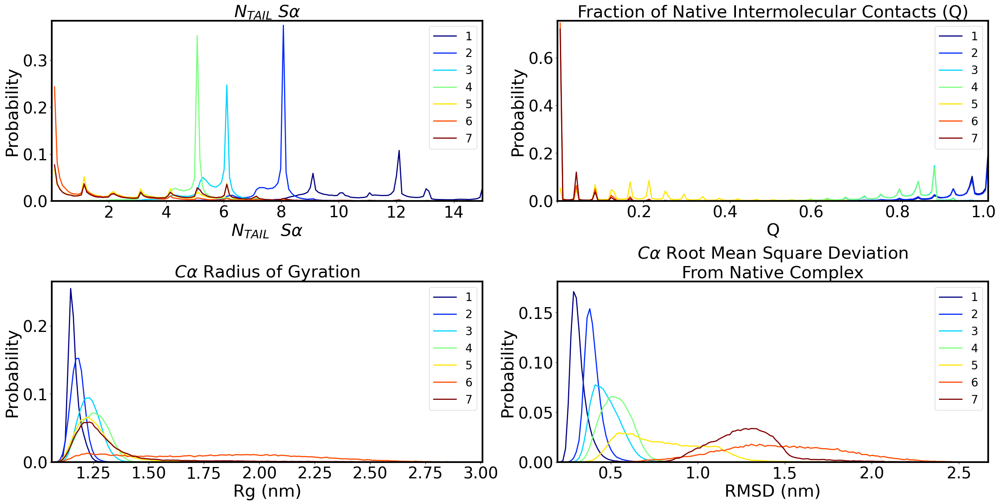

In [41]:
import matplotlib
fig, axes = plt.subplots(2,2,figsize=(25,12.5))
titles = [r"$N_{TAIL}$ $S\alpha$", "Fraction of Native Intermolecular Contacts (Q)",
          r"$C\alpha$ Radius of Gyration", 
          r"$C\alpha$ Root Mean Square Deviation" +"\n" + "From Native Complex"]
x_lab = [r'$N_{TAIL}$  $S\alpha$', "Q", r"Rg (nm)", "RMSD (nm)"]
for title, lab, var,ax in zip(titles, x_lab, "Sa_total,QP,rg,rmsd".split(","), axes.flat):
    ax.set_title(title,size=30)
    ax.set_xlabel(lab, size=30)
    ax.set_ylabel("Probability", size=30)
    ax.tick_params(labelsize = 28)
    if lab == "Q":
        offset = matplotlib.transforms.ScaledTranslation(2, 0, fig.dpi_scale_trans)
        for label in ax.xaxis.get_majorticklabels():
            label.set_transform(label.get_transform() + offset)
            ax.set_xticks(np.arange(0,1,.2).round(1),np.arange(.2,1.2,.2).round(1))
    ymax = 0
    for j,i in enumerate(frames_cl):
        v = d_tica[var]
        p,_,x = pmf1d(v[i],nbins = 160,range=(v.min(),v.max()))
        ax.plot(x,p,alpha=1,color=tica_model.state_colors[j],label=tica_model.ticklabels[j],lw = 2)
        ax.legend(fontsize=20)
        ax.set_xlim(v.min(),v.max())
        ymax = max(ymax,p.max())
        #ax.tick_params(axis="both", labelsize = 18)
        ax.set_ylim(0,ymax+.01)
plt.tight_layout()
        

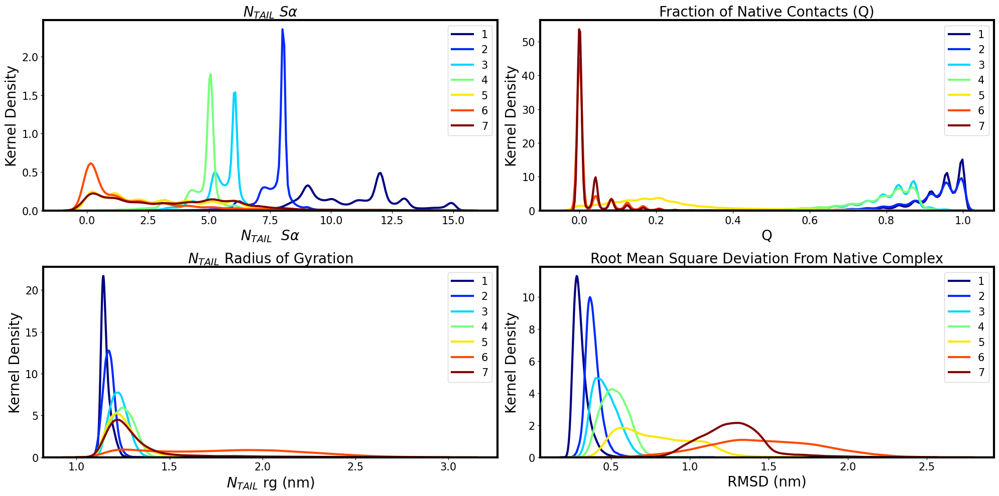

In [42]:
fig, axes = plt.subplots(2,2,figsize=(20,10))
titles = [r"$N_{TAIL}$ $S\alpha$", "Fraction of Native Contacts (Q)", "$N_{TAIL}$ Radius of Gyration", 
         "Root Mean Square Deviation From Native Complex"]
x_lab = [r'$N_{TAIL}$  $S\alpha$', "Q", r"$N_{TAIL}$ rg (nm)", "RMSD (nm)"]
for title, lab, var,ax in zip(titles, x_lab, "Sa_total,QP,rg,rmsd".split(","), axes.flat):
    ax.set_title(title,size=20)
    ax.set_xlabel(lab, size=20)
    ax.set_ylabel("Kernel Density", size=20)
    ax.tick_params(labelsize = 15)
    for j,i in enumerate(tica_model.frames_cl):
        v = tica_model.d[var][i]
        sns.kdeplot(v,alpha=1,color=tica_model.state_colors[j],label=tica_model.ticklabels[j], ax=ax,lw = 3)
        ax.legend(fontsize=15)
plt.tight_layout()

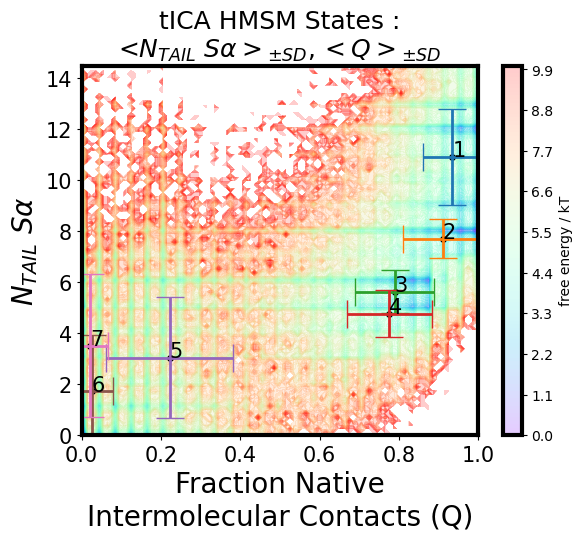

In [44]:
for var in ["QP","Sa_total"]:tica_model.state_ave(var)
#"fig,ax = plt.subplots(figsize = (50,50))
s = pyemma.plots.plot_free_energy(tica_model.d["QP"], tica_model.d["Sa_total"],
                                  cmap = "rainbow", alpha=.2)
plt.xlabel("Fraction Native"+"\n"+ "Intermolecular Contacts (Q)", size = 20);plt.ylabel(r"$N_{TAIL}$ $S\alpha$", size = 20)
plt.tick_params(labelsize=20)
#cbar = plt.colorbar(s,labelsize=18)

plt.title(r"tICA HMSM States :"+"\n" r"<$N_{TAIL}$ $S\alpha>_{\pm SD},<Q>_{\pm SD}$", size = 18)
for i,name in enumerate(tica_model.ticklabels):
    plt.errorbar(x=tica_model.d["QP_ave"][i,0],y=tica_model.d["Sa_total_ave"][i,0],
                 xerr = tica_model.d["QP_ave"][i,1],yerr = tica_model.d["Sa_total_ave"][i,1],
                 ls = "none",ms = 0, c =f"C{i}",capsize=10,alpha = 1, label=True,
                 lw = 2)
    plt.scatter(tica_model.d["QP_ave"][i,0], tica_model.d["Sa_total_ave"][i,0], s =15, c = "black")
    plt.annotate(f"{name}", xy=(tica_model.d["QP_ave"][i,0], tica_model.d["Sa_total_ave"][i,0]), size = 15)
plt.xlim(0,1)
plt.ylim(0,14.5)
plt.tick_params(axis="both", labelsize=15)

/home/t/Downloads/msmtool.py:752: RuntimeWarning: overflow encountered in exp
  q = np.sum(1/(1+np.exp(100*(d-(d0+.1)))),axis=0)/dmat.shape[1]          #.0=.1 changing for test


Enter the number of XD residues to truncate off the contact map for cluster: 1 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))


Enter the number of XD residues to truncate off the contact map for cluster: 2 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))


Enter the number of XD residues to truncate off the contact map for cluster: 3 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))


Enter the number of XD residues to truncate off the contact map for cluster: 4 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))


Enter the number of XD residues to truncate off the contact map for cluster: 5 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))


Enter the number of XD residues to truncate off the contact map for cluster: 6 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))


Enter the number of XD residues to truncate off the contact map for cluster: 7 (trancation starts at begining of XD chain)14


/home/t/Downloads/msmtool.py:823: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))
/home/t/Downloads/msmtool.py:857: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))
/home/t/Downloads/msmtool.py:861: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.execute_constrained_layout()
/home/t/Downloads/msmtool.py:857: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-100,101,25)))
/home/t/Downloads/msmtool.py:861: UserWarning: There are no gridspecs with layoutgrids. Possibly did not call parent GridSpec with the "figure" keyword
  fig.execute_constrained_layout()
/home/t/Downloads/msmtool.py:857: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.set_ticklabels(abs(np.arange(-

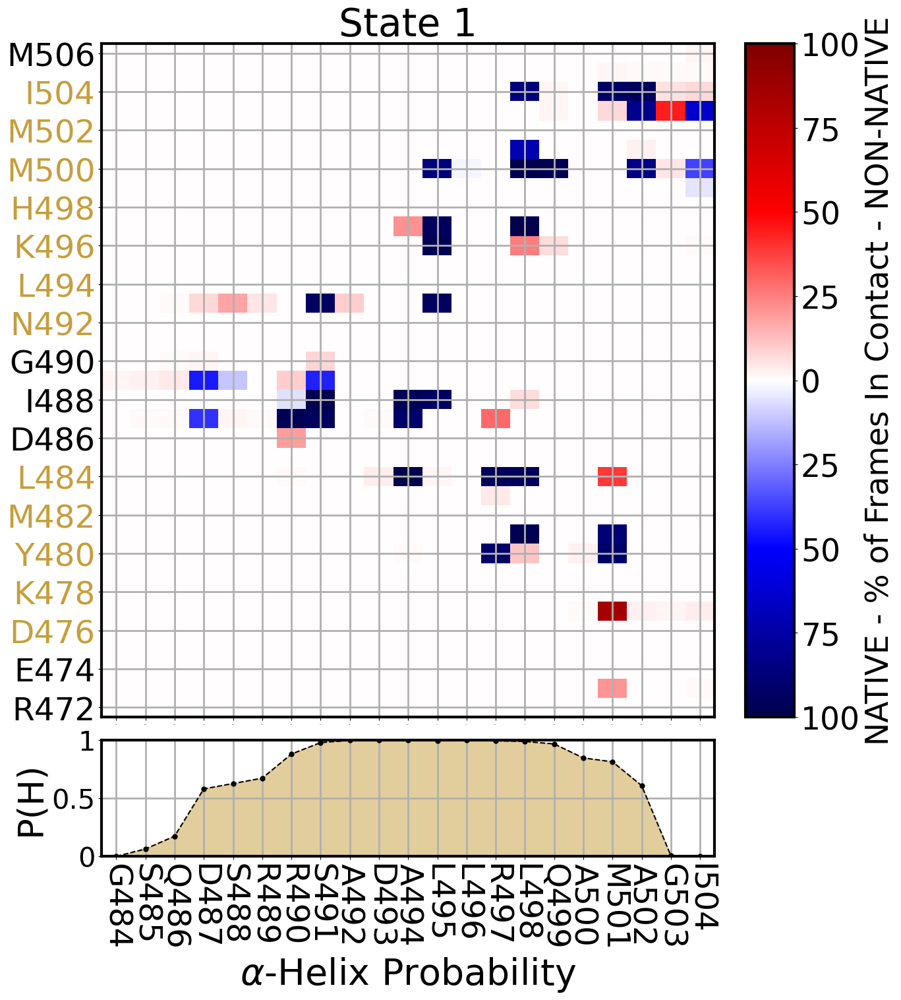

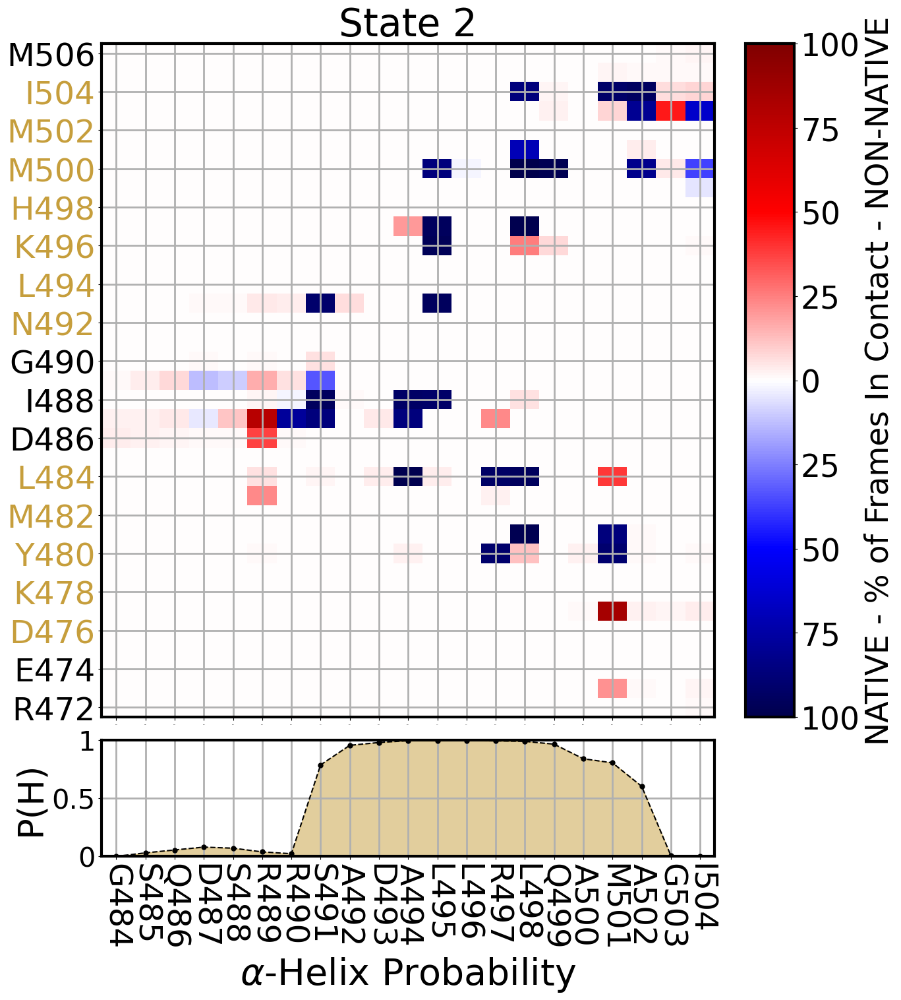

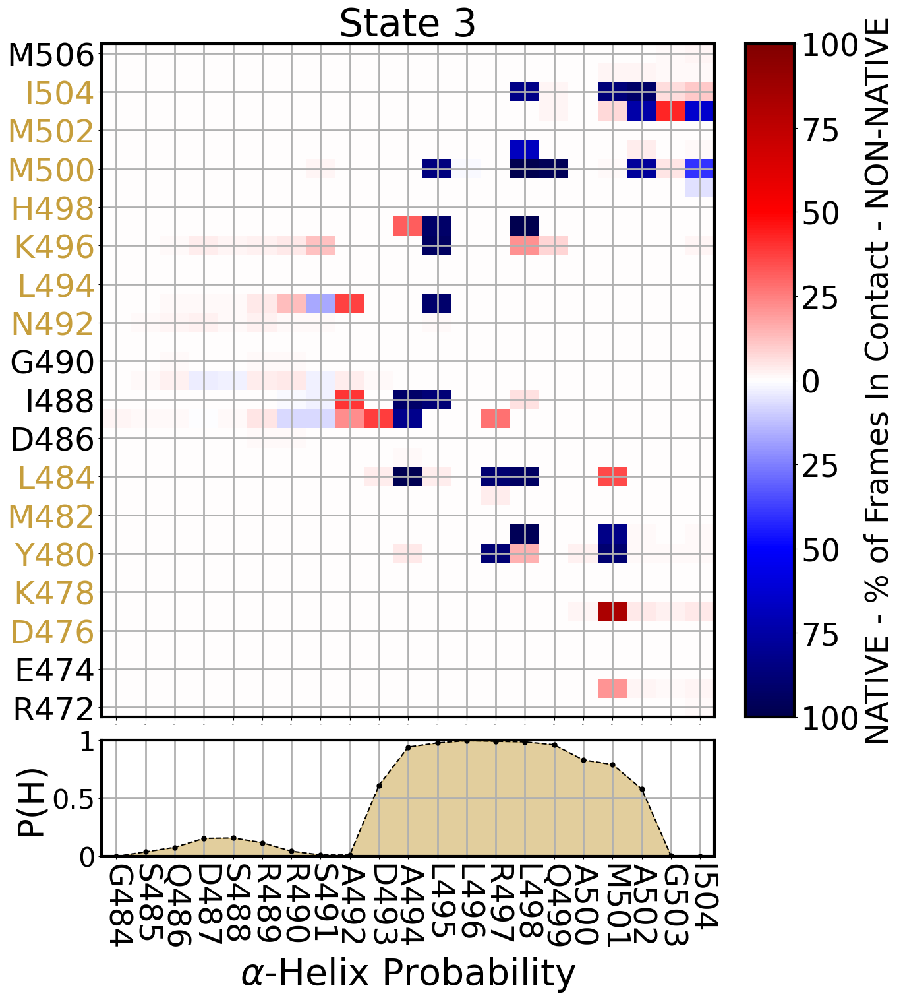

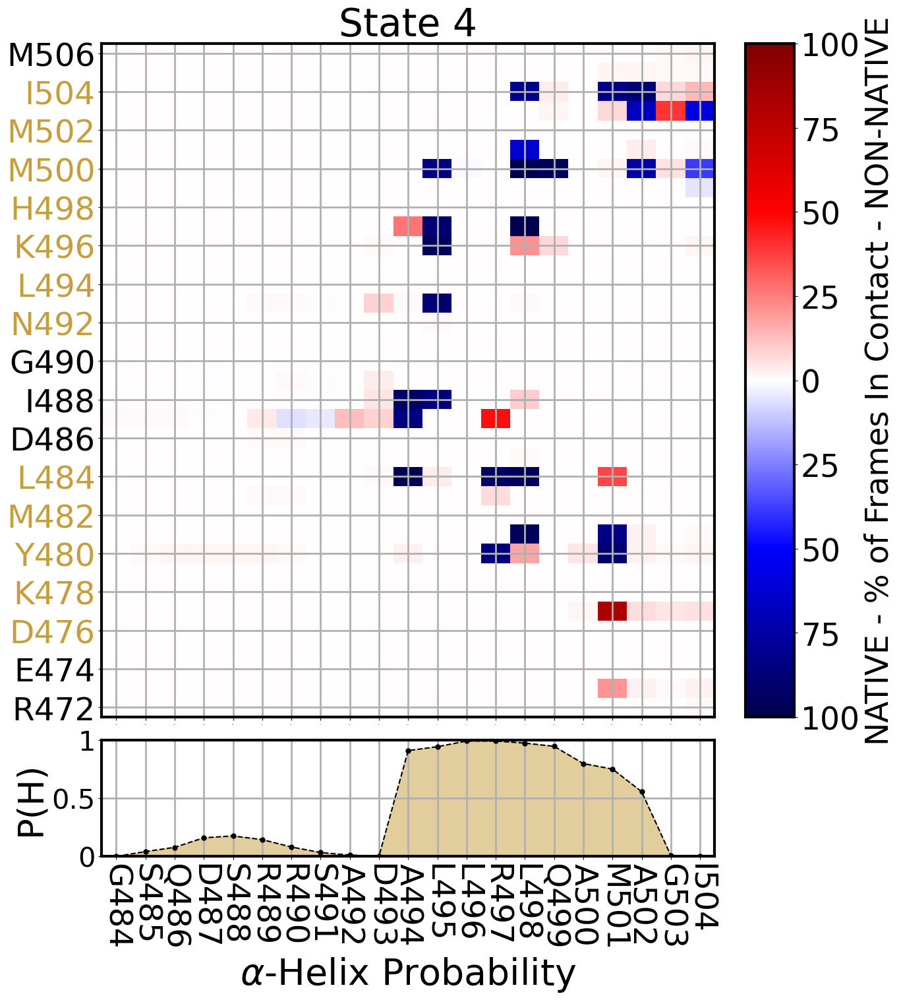

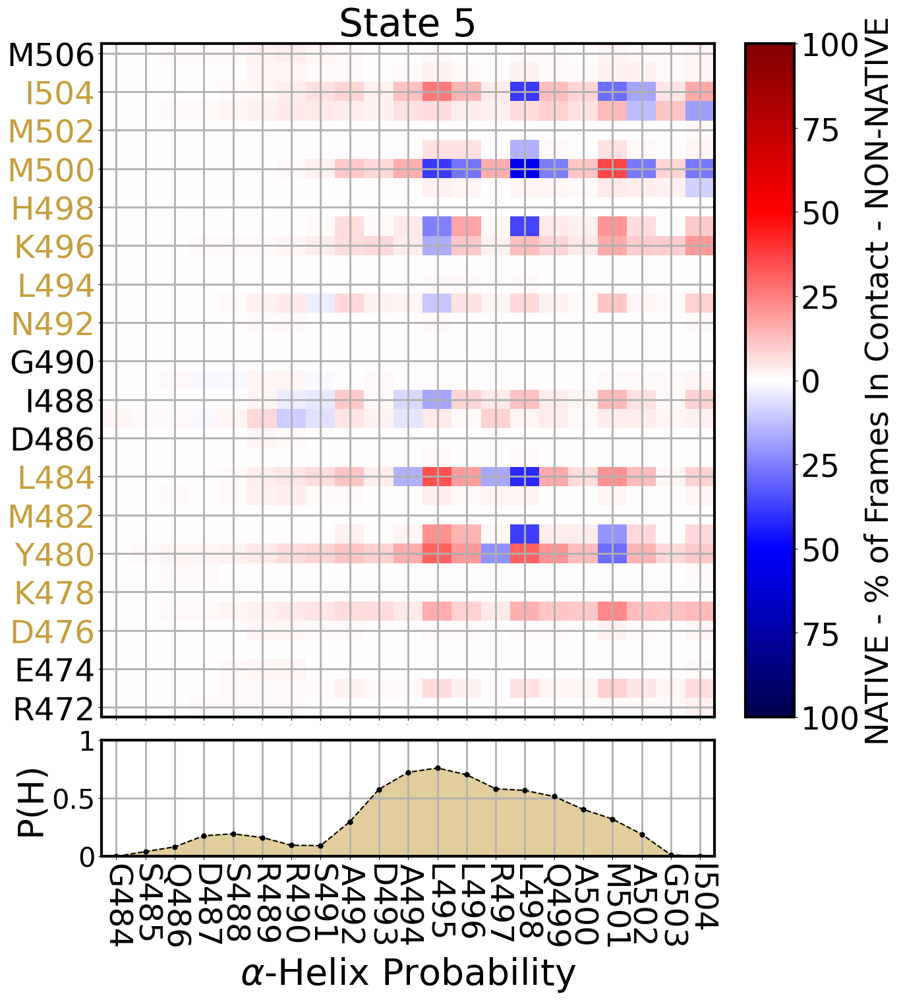

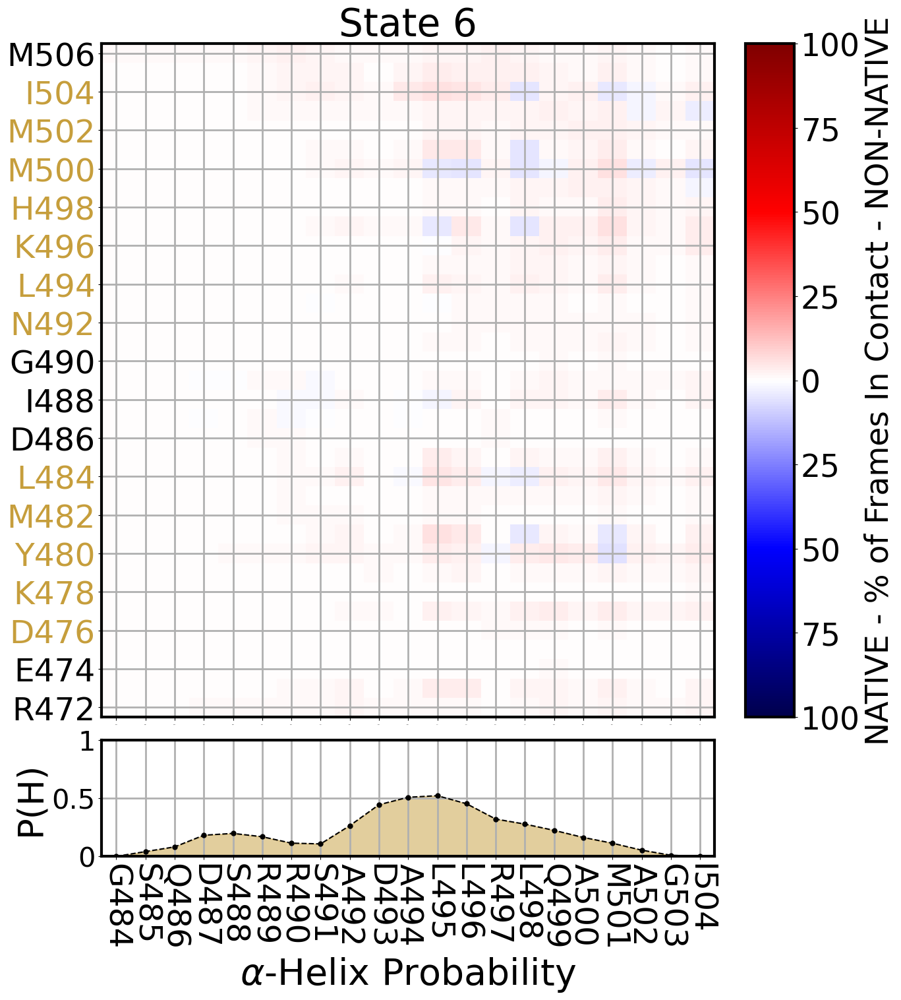

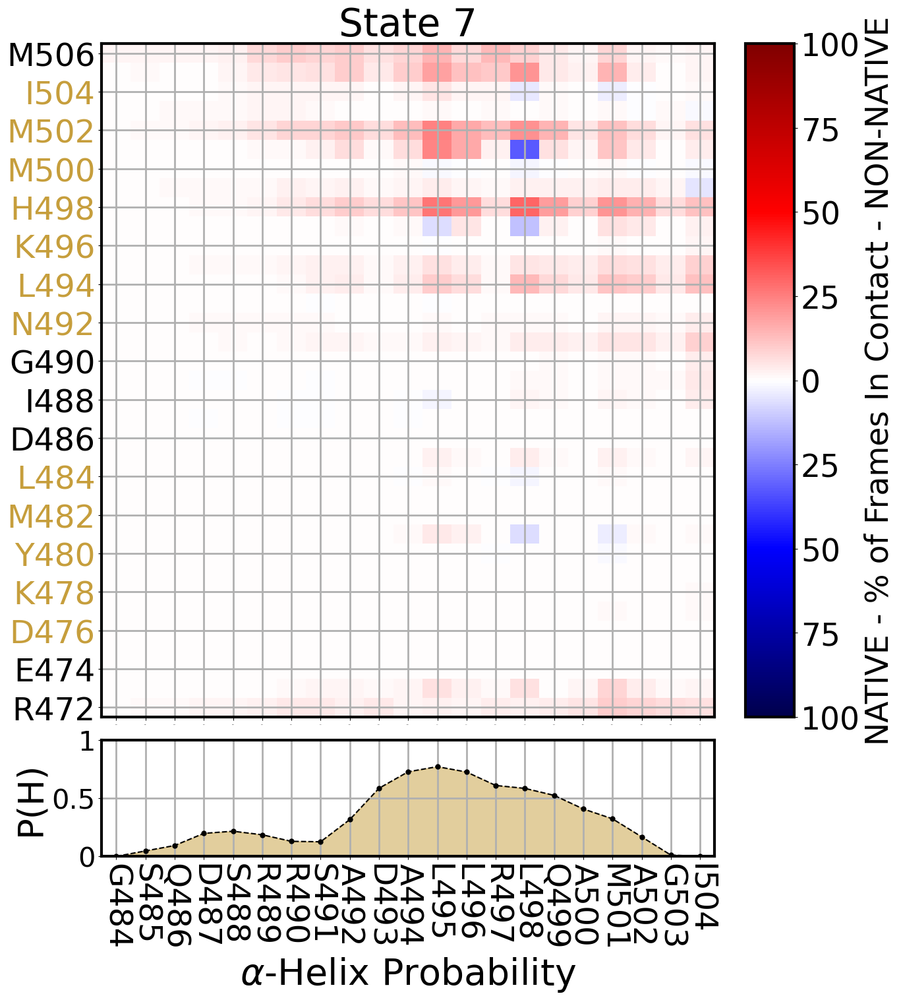

In [45]:
#contact maps
_ =tica_model.Q(.5,0,"residues",True)
_ =tica_model.contact_maps(.5,"XD",r"$N_{TAIL}$")
plt.close("all")
for i in range(7):
    tica_model.contact_maps_helix(i,14, r"$\alpha$-Helix Probability", "")

In [47]:
#flux
M = pyemma.msm.markov_model(tmats_reidx[0])
tpt = pyemma.msm.tpt(M, [5],[0,1])
F = tpt.gross_flux
Fp = tpt.net_flux
(paths,pathfluxes) = tpt.pathways()
cumflux = 0
print("Path flux\t\t%path\t%of total\tpath")
for i in range(len(paths)):
    cumflux += pathfluxes[i]
    print(pathfluxes[i],'\t','%3.1f'%(100.0*pathfluxes[i]/tpt.total_flux),'%\t','%3.1f'%(100.0*cumflux/tpt.total_flux),'%\t\t',np.array(paths[i])+1)

Path flux		%path	%of total	path
0.0008051794890316426 	 46.1 %	 46.1 %		 [6 5 3 2]
0.0003313374284863273 	 19.0 %	 65.1 %		 [6 5 4 3 1]
0.00031244481590608336 	 17.9 %	 83.0 %		 [6 5 2]
0.00013056270841205647 	 7.5 %	 90.4 %		 [6 5 1]
5.239442801175588e-05 	 3.0 %	 93.4 %		 [6 3 1]
4.3276393749314265e-05 	 2.5 %	 95.9 %		 [6 5 4 2]
2.9040859813634333e-05 	 1.7 %	 97.6 %		 [6 7 5 4 2]
2.2950082142385215e-05 	 1.3 %	 98.9 %		 [6 4 1]
8.947979816651906e-06 	 0.5 %	 99.4 %		 [6 1]
5.218273855438482e-06 	 0.3 %	 99.7 %		 [6 4 2]
5.2094555674602516e-06 	 0.3 %	 100.0 %		 [6 7 5 3 1]


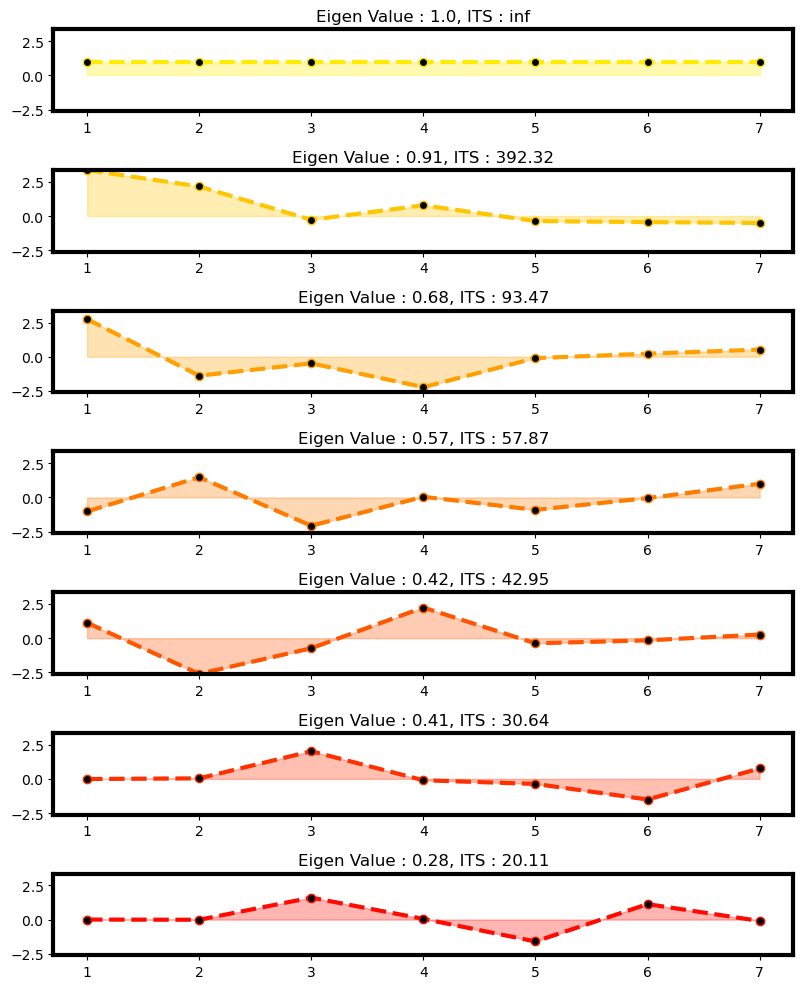

In [189]:
eigen_vecs = hmm.eigenvectors_right()
lam = hmm.eigenvalues().round(2)

its = np.array( [np.inf]+ hmm.timescales().round(2).tolist())
lam = tica_model.msm.eigenvalues().round(2)
fig, axes = plt.subplots(7,1, figsize=(8,10))
for i,(c,ax,l ,it) in enumerate(zip(clist, axes.flat, lam, its)):
    ax.plot(np.arange(1,8), eigen_vecs[:,i], ls = "--",lw = 3, ms = 12, marker = ".", 
            markerfacecolor= "black",color = c)
    ax.fill_between(np.arange(1,8), eigen_vecs[:,i], color = c, alpha = .3)
    ax.set_title(f"Eigen Value : {l}, ITS : {it}")
    ax.set_ylim(eigen_vecs.min(), eigen_vecs.max()+.001)
    ax.set_xticks(np.arange(1,8), tica_model.ticklabels)
plt.tight_layout()